In [1]:
from typing import Any
import pandas as pd 
import os, time 
from pathlib import Path 
import numpy as np 
import matplotlib.pyplot as plt 
from functools import wraps 

# model build 
import tensorflow as tf 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, classification_report, precision_recall_curve, confusion_matrix
from keras import Sequential, layers
import tf2onnx, onnx, keras 

2024-11-01 02:38:25.853172: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-01 02:38:25.865148: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-01 02:38:25.877693: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-01 02:38:25.881480: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-01 02:38:25.891090: I tensorflow/core/platform/cpu_feature_guar

In [2]:
tf.__version__, keras.version(), tf2onnx.__version__, onnx.__version__

('2.17.0', '3.6.0', '1.16.1', '1.17.0')

## Labelled Dataset Column

In [3]:
column_names_det = [
    "user_ip", "domain", "timestamp", "attack", "request", "len", 
    "subdomains_count", "w_count", "w_max", "entropy", "w_max_ratio", 
    "w_count_ratio", "digits_ratio", "uppercase_ratio", "time_avg", 
    "time_stdev", "size_avg", "size_stdev", "throughput", "unique", 
    "entropy_avg", "entropy_stdev"
]

column_names = [
    "id", "domain"
]

## Train Model on GPU

In [4]:
GPU: Any = tf.config.list_physical_devices("GPU")
if len(GPU) > 0:
    print(f'training the model on GPU {GPU} {tf.config.list_physical_devices("GPU")}')
    for gpu in tf.config.list_physical_devices("GPU"):
        tf.config.experimental.set_memory_growth(gpu, True)
else:
    print("Using the default cpu runtime ", tf.config.list_physical_devices())

training the model on GPU [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')] [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]


## Explore and visualize benign data 

In [10]:
## explore benign dataset 
import matplotlib.pyplot as plt
import seaborn as sns

class Ds:
    def __init__(self, path) -> None:
        self.path = path
        self.shuffleSize = 12_000  


    @staticmethod
    def calculate_entropy(domain: str) -> float:
        """Calculates Shannon entropy for a given string."""
        probabilities = pd.Series(list(domain)).value_counts(normalize=True)
        entropy = -np.sum(probabilities * np.log2(probabilities))
        return entropy
        
    def read_pandas(self) -> None:
        data = pd.read_csv(self.path, chunksize=100_000, names=column_names,delimiter=",")

        
        for val in data:
            val['subdomain'] = val['domain'].apply(lambda x: '.'.join(x.split('.')[:-2]))
            val['total_dots'] = val['domain'].str.count("\.")
            val['total_dots_subdomain'] = val['subdomain'].str.count("\.")
            
            val['total_chars'] = val['domain'].str.len() - val['total_dots']
            val['total_chars_subdomain'] = val['subdomain'].str.len() - val['total_dots_subdomain']
            val['total_num_chars'] = val['domain'].str.count('\d')

            val['total_labels'] = val['domain'].str.split('.').apply(lambda xx: len(xx))
            val['max_label_length'] = val['domain'].apply(lambda x: max(len(word) for word in x.split('.')))

            val['entropy'] = val['domain'].apply(Ds.calculate_entropy)
            self.plot_hist(val)
            self.plot_data(val)
            # print(val.iloc[0:])
            # break

    def read_malicious_ds(self) -> None:
        print('feature engineer the malicious dataset from iodine and DET')
        data = pd.read_csv(self.path, chunksize=200_000, names=column_names_det,delimiter=",")
        for val in data:
            val['subdomain'] = val['request'].apply(lambda x: '.'.join(x.split('.')[:-2]))
            val['total_dots'] = val['request'].str.count("\.")
            val['total_dots_subdomain'] = val['request'].str.count("\.")
            
            val['total_chars'] = val['request'].str.len() - val['total_dots']
            val['total_chars_subdomain'] = val['subdomain'].str.len() - val['total_dots_subdomain']
            val['total_num_chars'] = val['request'].str.count('\d')

            val['total_labels'] = val['request'].str.split('.').apply(lambda xx: len(xx))
            val['max_label_length'] = val['request'].apply(lambda x: max(len(word) for word in x.split('.')))

            # print(val[['request','subdomain', 'total_dots', 'total_dots_subdomain', 'total_chars', 'total_chars_subdomain', 'total_num_chars', 
            #                    'total_labels', 'max_label_length'])
            break
        

    def plot_hist(self, val):
        plt.figure(figsize=(15, 10))

        # Histogram of Total Characters
        plt.subplot(2, 2, 1)
        sns.histplot(val['total_chars'], bins=30, kde=True)
        plt.title('Distribution of Total Characters in Domains')
        plt.xlabel('Total Characters')
        plt.ylabel('Frequency')

        # Bar Chart of Total Dots
        plt.subplot(2, 2, 2)
        sns.countplot(x='total_dots', data=val)
        plt.title('Count of Domains by Total Dots')
        plt.xlabel('Total Dots')
        plt.ylabel('Count')

        plt.subplot(2, 2, 3)
        plt.hist(val['entropy'], bins=30, color='green', edgecolor='black')
        plt.title('Distribution of Entropy in Domains')
        plt.xlabel('Entropy')
        plt.ylabel('Frequency')
        
        # Plot 2: Scatter Plot of Total Characters vs Entropy
        plt.subplot(2, 2, 4)
        plt.scatter(val['total_chars'], val['entropy'], alpha=0.6, c='purple')
        plt.title('Total Characters vs. Entropy in Domains')
        plt.xlabel('Total Characters in Domain')
        plt.ylabel('Entropy')

        plt.figure(figsize=(15, 10))
        # Box Plot of Max Word Length
        plt.subplot(2, 2, 1)
        sns.boxplot(x='max_label_length', data=val)
        plt.title('Box Plot of Maximum Word Length in Domains')
        plt.xlabel('Max Label Length')

        # Count Plot of Total Labels
        plt.subplot(2, 2, 2)
        sns.countplot(x='total_labels', data=val)
        plt.title('Count of Domains by Total Labels')
        plt.xlabel('Total Labels')
        plt.ylabel('Count')

        plt.tight_layout()
        plt.show()
    def plot_data(self, val):
            plt.figure(figsize=(20, 15))
    
            # Scatter Plot: Total Characters vs. Max Label Length
            plt.subplot(2, 2, 1)
            sns.scatterplot(
                x='total_chars', y='max_label_length', hue='total_labels', size='total_dots',
                sizes=(20, 200), palette='viridis', data=val
            )
            plt.title('Total Characters vs. Max Word Length (Colored by Total Labels)')
            plt.xlabel('Total Characters')
            plt.ylabel('Max Label Length')
    
            # Scatter Plot: Total Dots vs. Total Labels
            plt.subplot(2, 2, 2)
            sns.scatterplot(
                x='total_dots', y='total_labels', hue='total_chars', size='max_label_length',
                sizes=(20, 200), palette='coolwarm', data=val
            )
            plt.title('Total Dots vs. Total Labels (Colored by Total Characters)')
            plt.xlabel('Total Dots')
            plt.ylabel('Total Labels')
    
            # Scatter Plot: Total Characters Subdomain vs. Total Dots Subdomain
            plt.subplot(2, 2, 3)
            sns.scatterplot(
                x='total_chars_subdomain', y='total_dots_subdomain', hue='total_labels', size='total_num_chars',
                sizes=(20, 200), palette='plasma', data=val
            )
            plt.title('Total Characters Subdomain vs. Total Dots Subdomain (Colored by Total Labels)')
            plt.xlabel('Total Characters in Subdomain')
            plt.ylabel('Total Dots in Subdomain')

            # Scatter Plot: Total Characters vs. Total Numeric Characters
            plt.subplot(2, 2, 4)
            sns.scatterplot(
                x='total_chars', y='total_num_chars', hue='total_labels', size='total_dots',
                sizes=(20, 200), palette='magma', data=val
            )
            plt.title('Total Characters vs. Total Numeric Characters (Colored by Total Labels)')
            plt.xlabel('Total Characters')
            plt.ylabel('Total Numeric Characters')


            # Pair Plot: Selected Features
            sns.pairplot(val[['total_chars', 'max_label_length', 'total_labels', 'total_dots']], palette='cubehelix')
            plt.suptitle('Pair Plot of Total Characters, Max Label Length, Total Labels, and Total Dots', y=1.02)
    
            plt.tight_layout()
            plt.show()


<>:24: SyntaxWarning: invalid escape sequence '\.'
<>:25: SyntaxWarning: invalid escape sequence '\.'
<>:29: SyntaxWarning: invalid escape sequence '\d'
<>:45: SyntaxWarning: invalid escape sequence '\.'
<>:46: SyntaxWarning: invalid escape sequence '\.'
<>:50: SyntaxWarning: invalid escape sequence '\d'
<>:24: SyntaxWarning: invalid escape sequence '\.'
<>:25: SyntaxWarning: invalid escape sequence '\.'
<>:29: SyntaxWarning: invalid escape sequence '\d'
<>:45: SyntaxWarning: invalid escape sequence '\.'
<>:46: SyntaxWarning: invalid escape sequence '\.'
<>:50: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_108970/466840731.py:24: SyntaxWarning: invalid escape sequence '\.'
  val['total_dots'] = val['domain'].str.count("\.")
/tmp/ipykernel_108970/466840731.py:25: SyntaxWarning: invalid escape sequence '\.'
  val['total_dots_subdomain'] = val['subdomain'].str.count("\.")
/tmp/ipykernel_108970/466840731.py:29: SyntaxWarning: invalid escape sequence '\d'
  val['total_num_chars

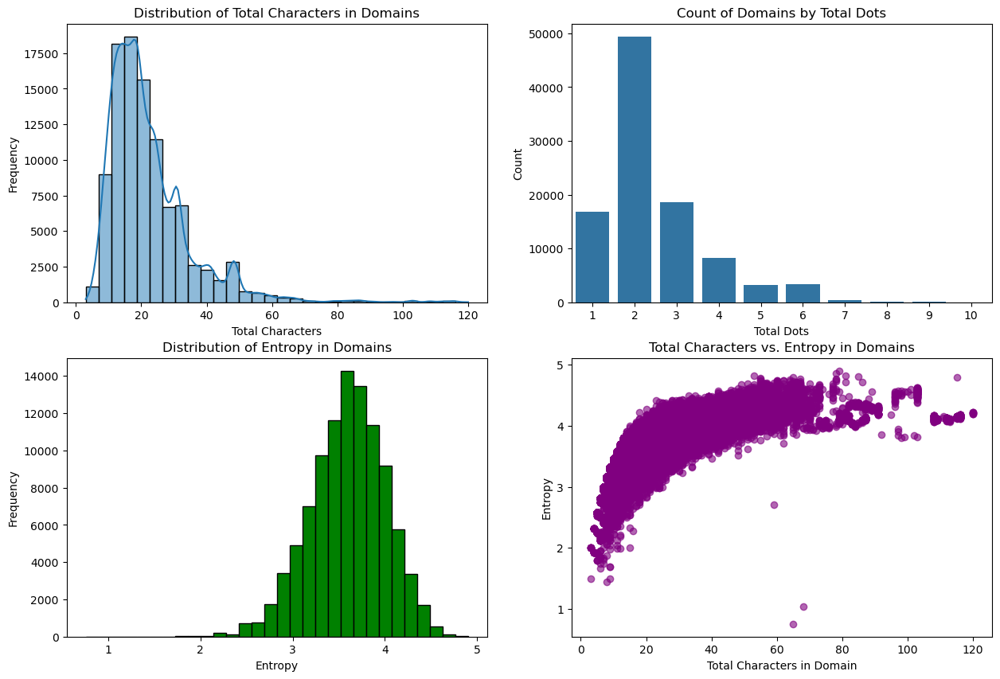

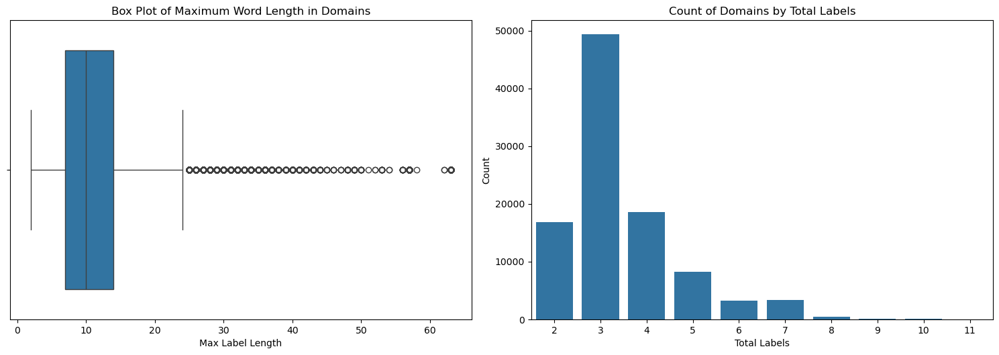

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

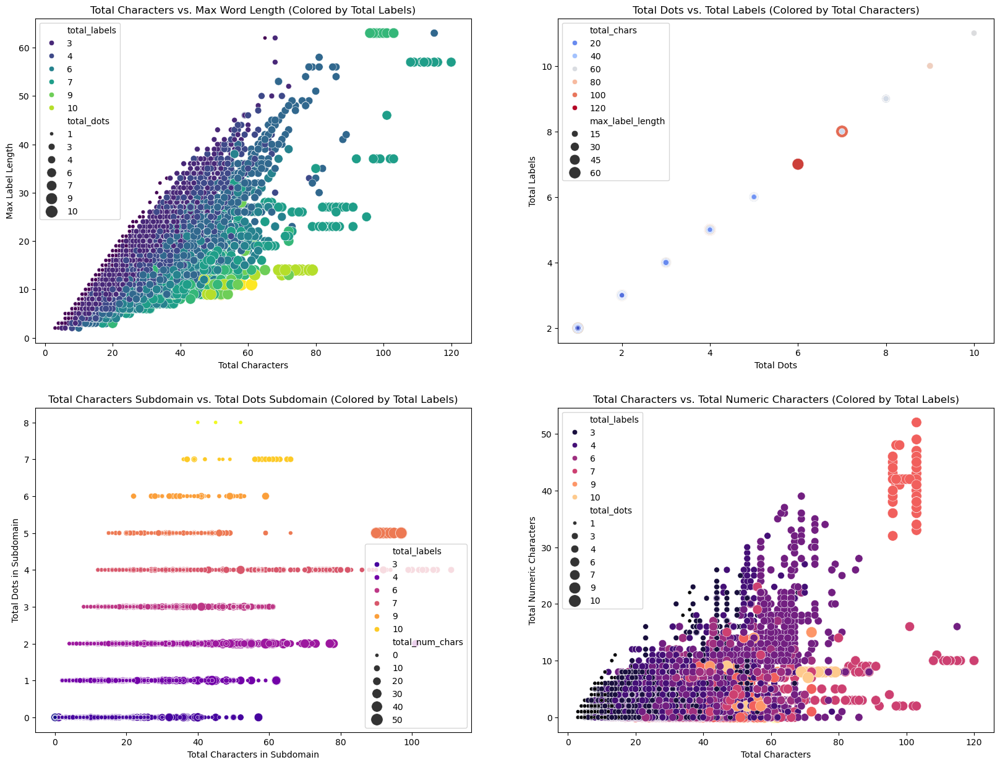

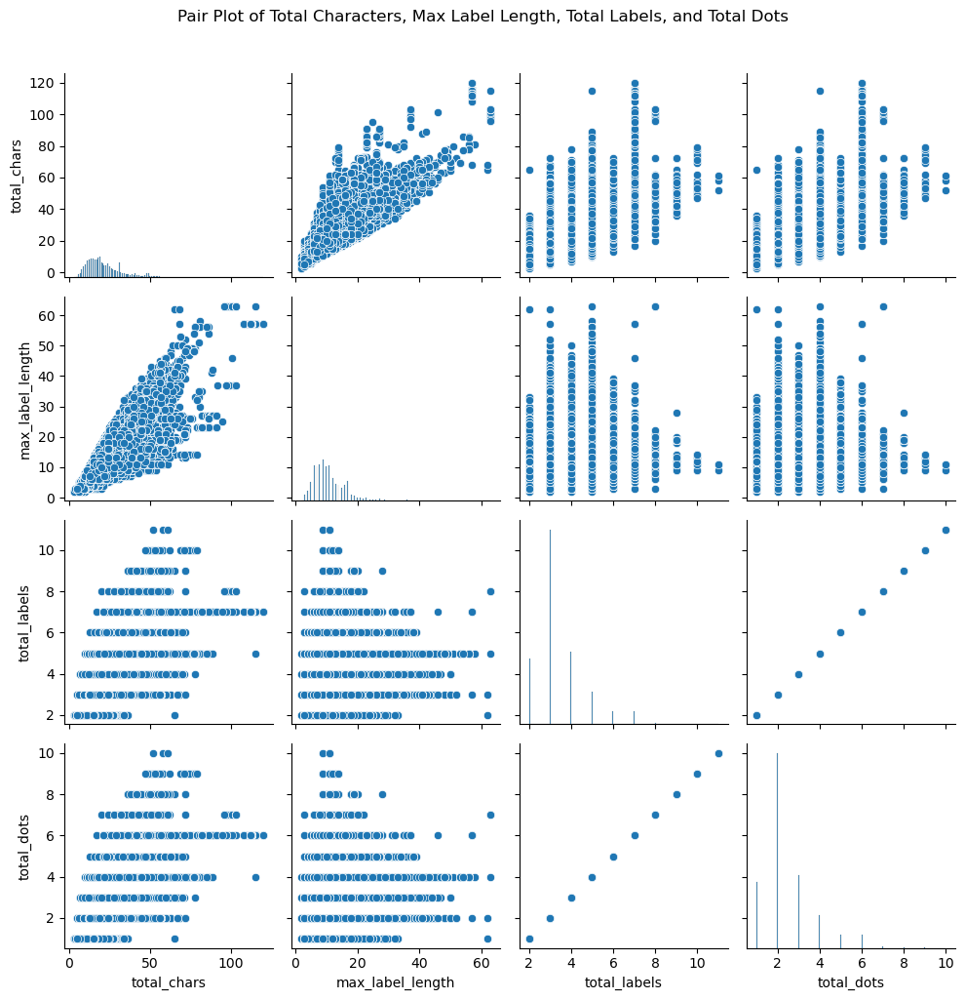

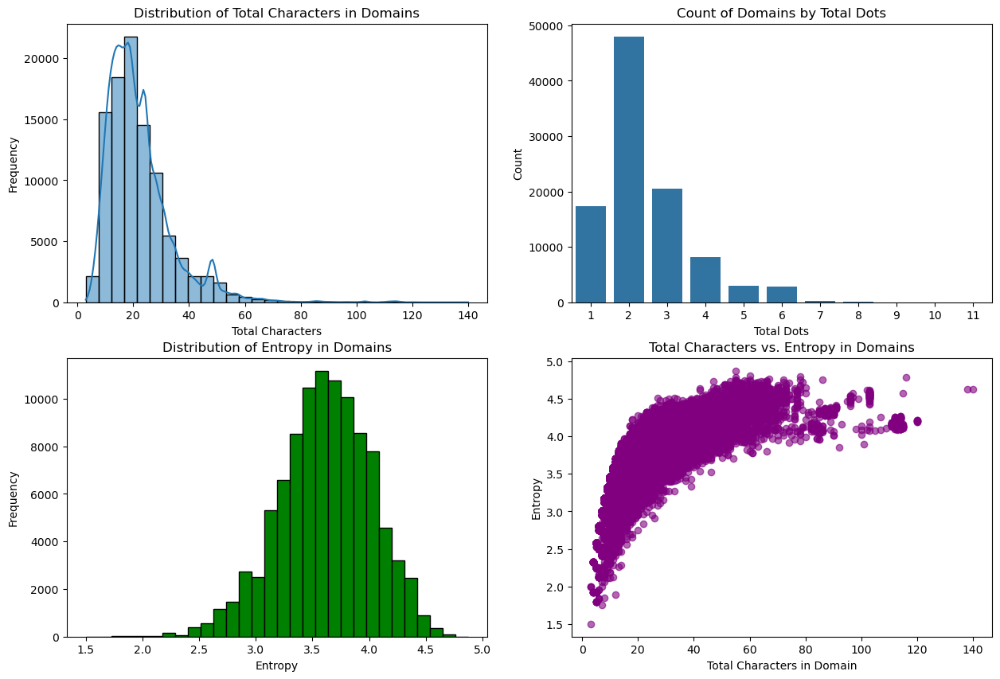

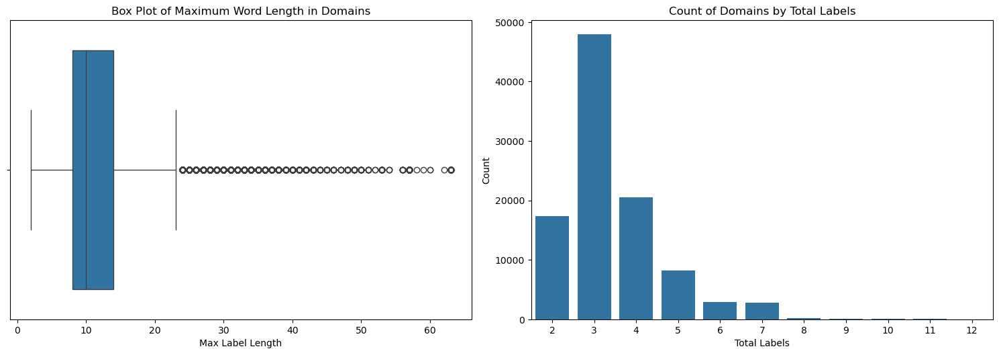

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

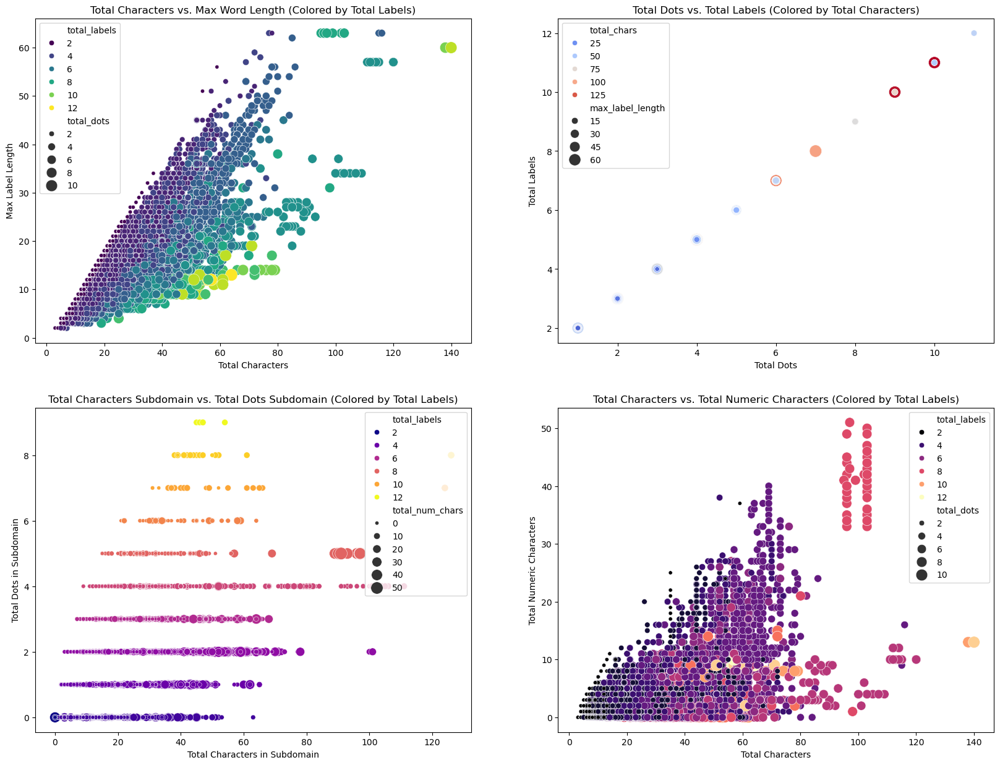

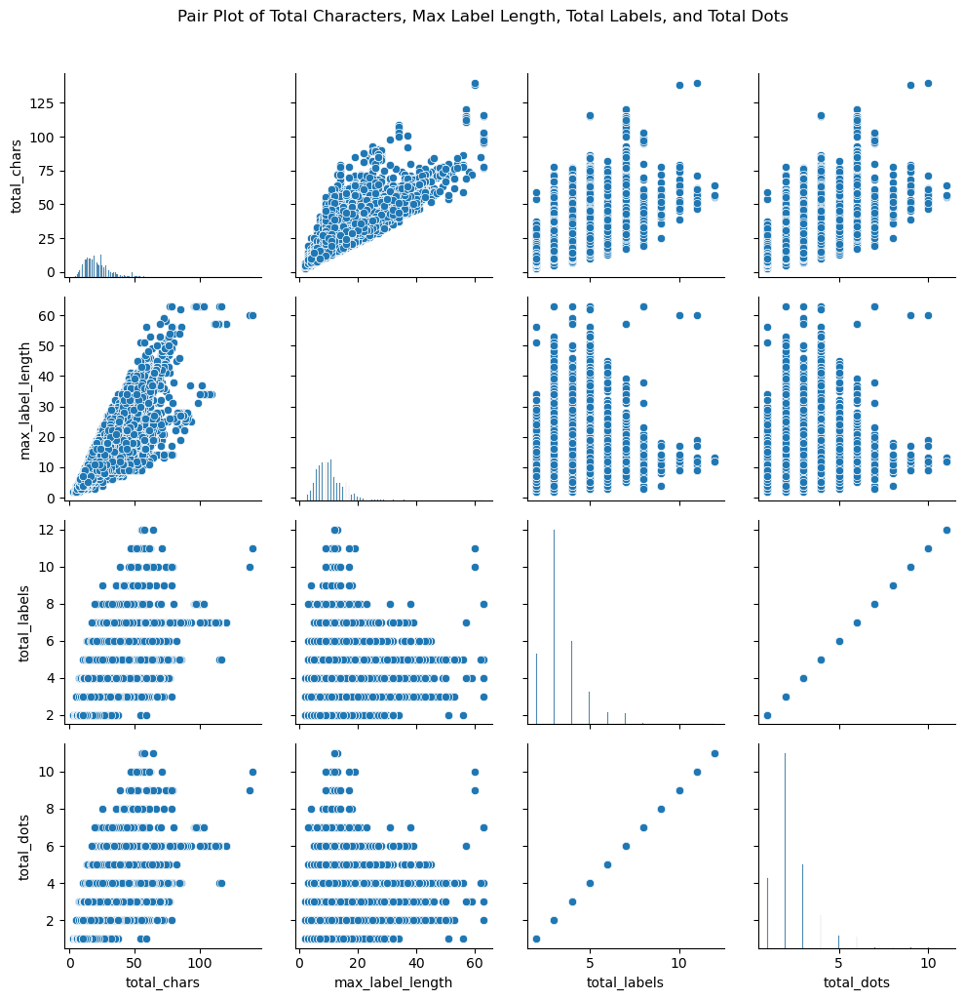

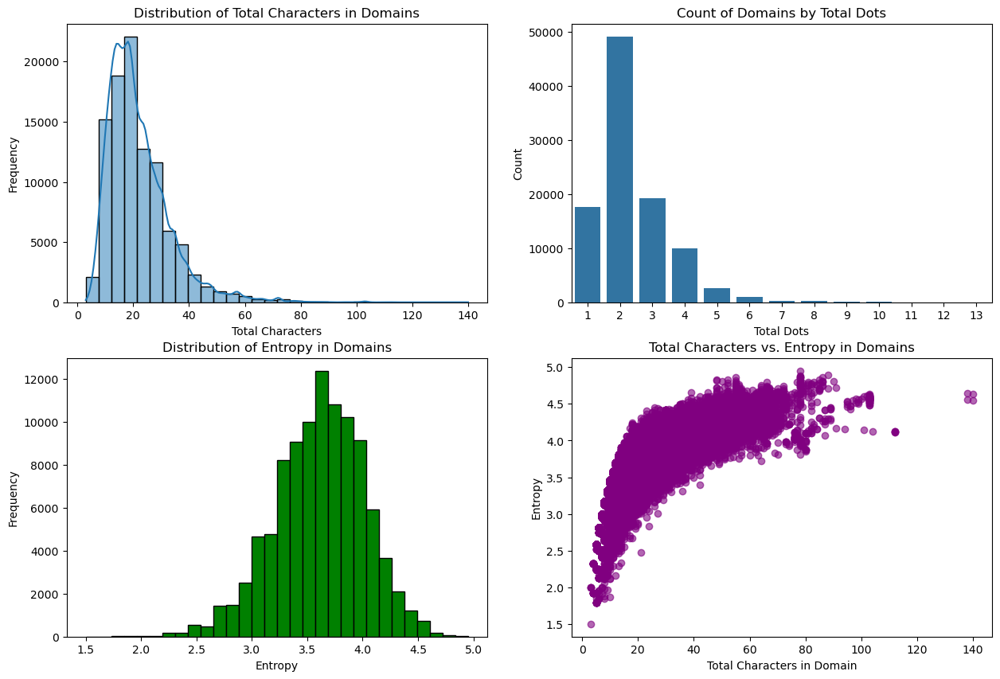

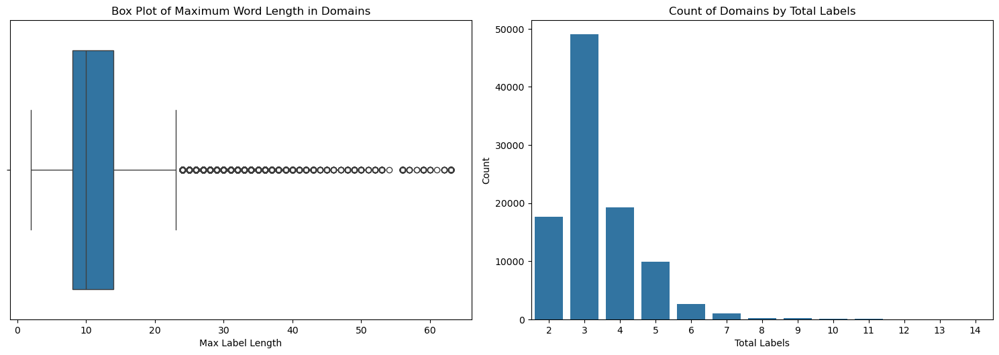

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

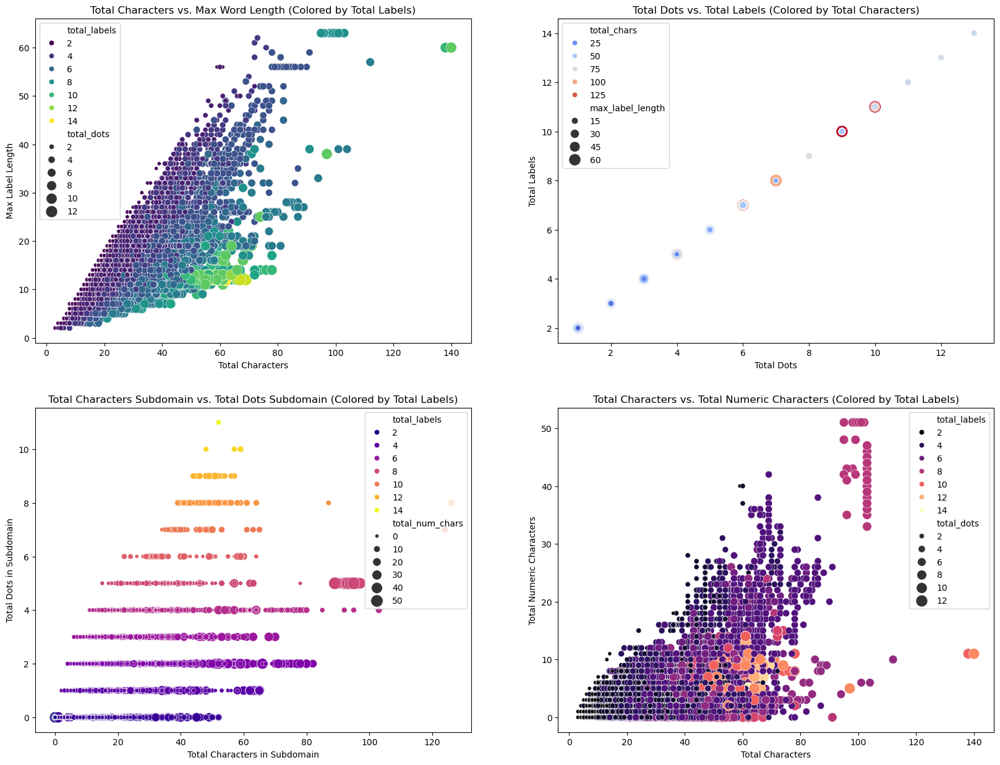

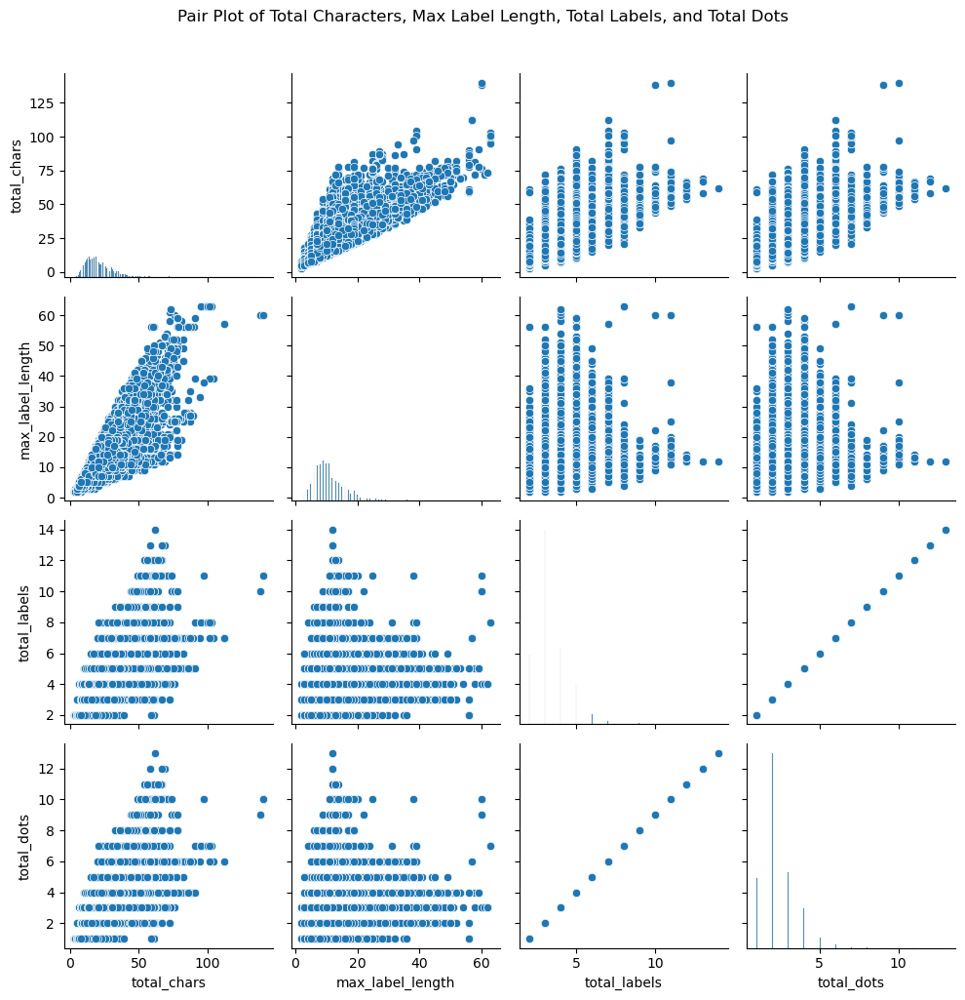

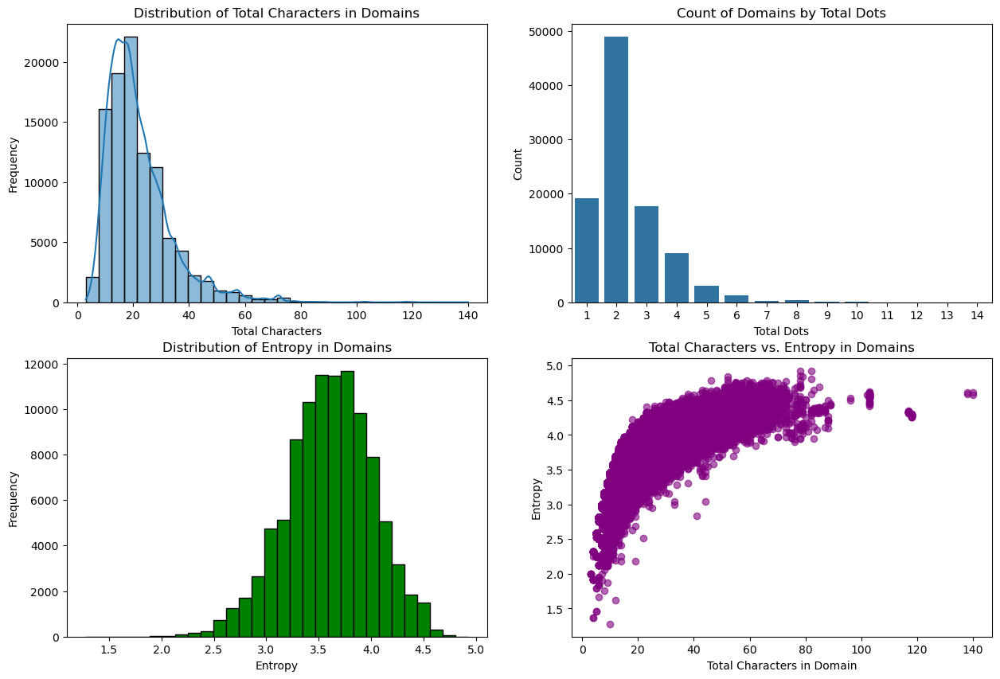

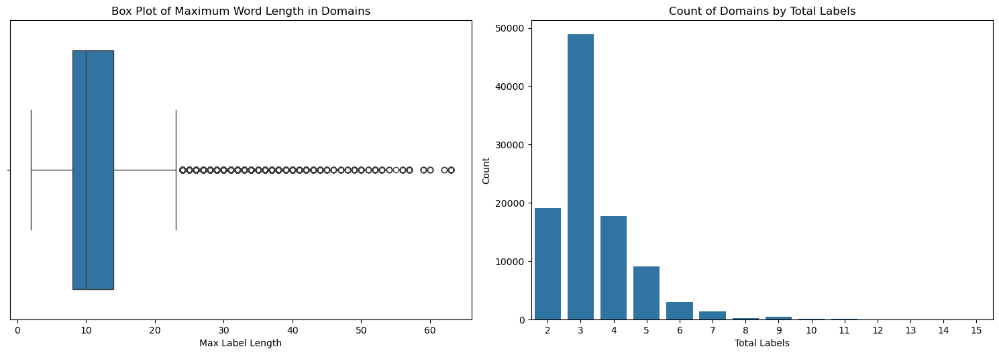

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

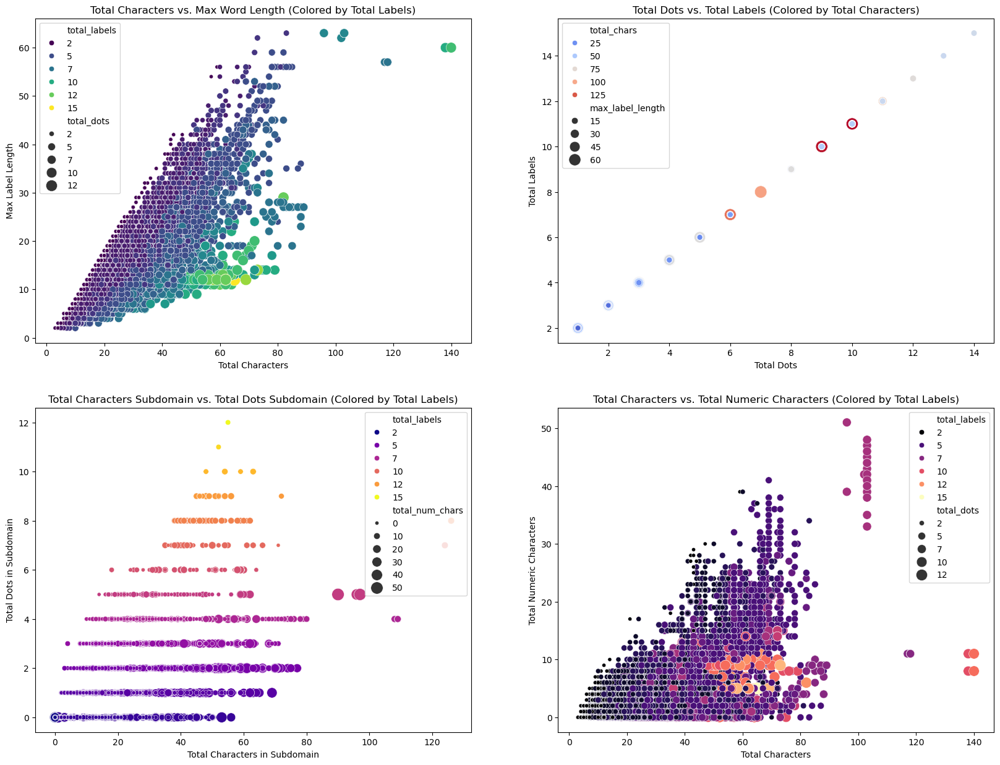

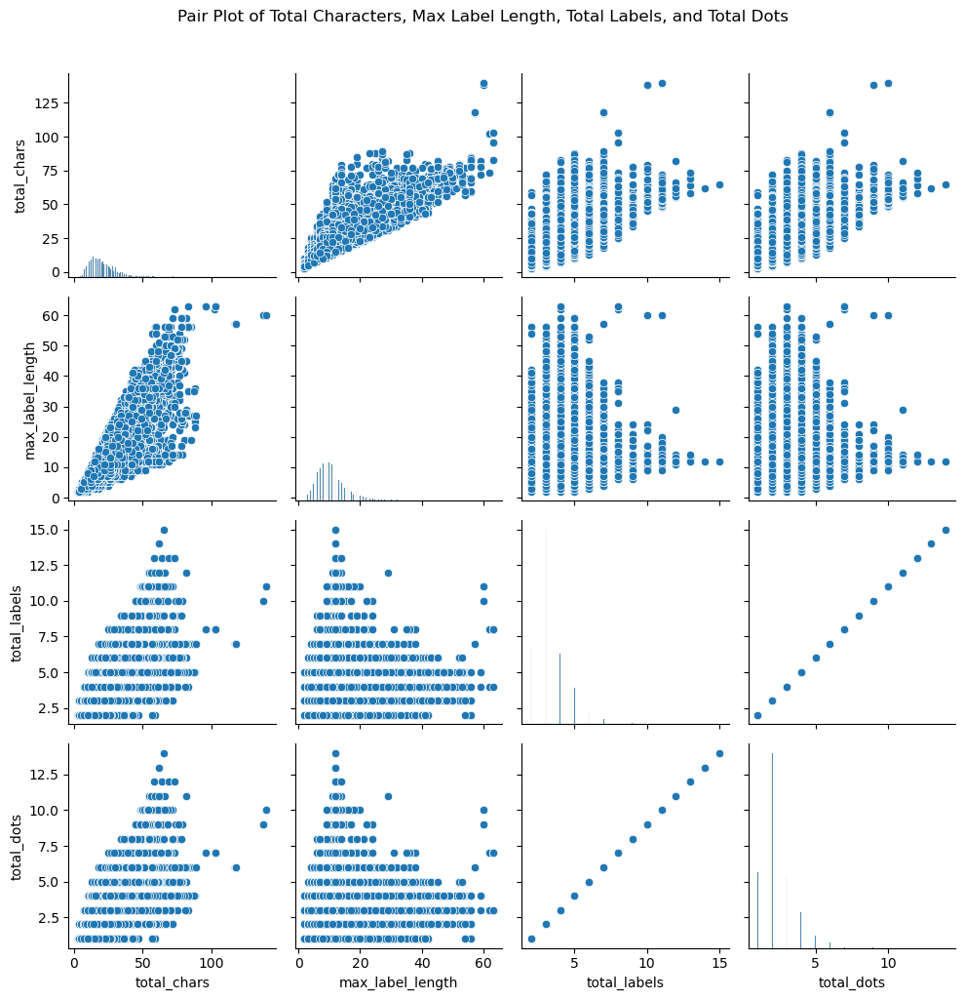

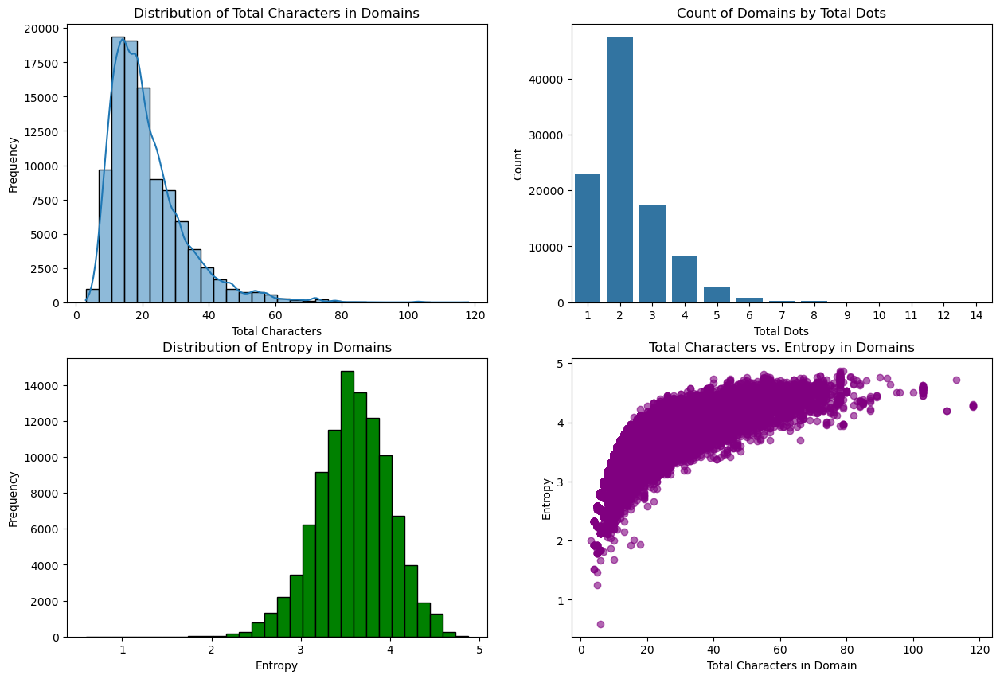

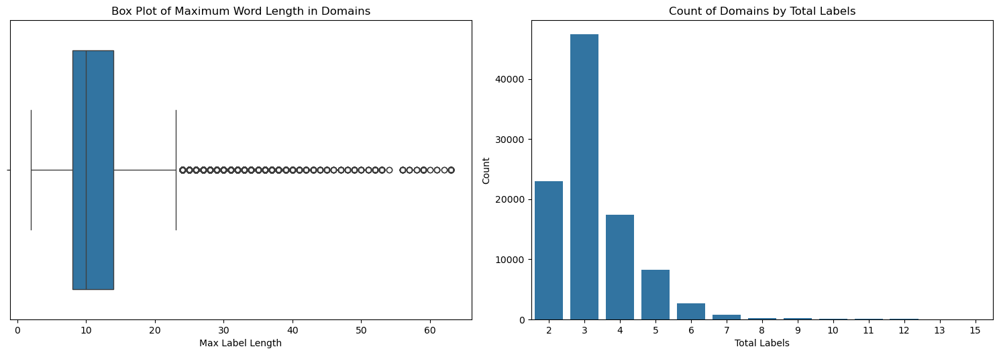

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

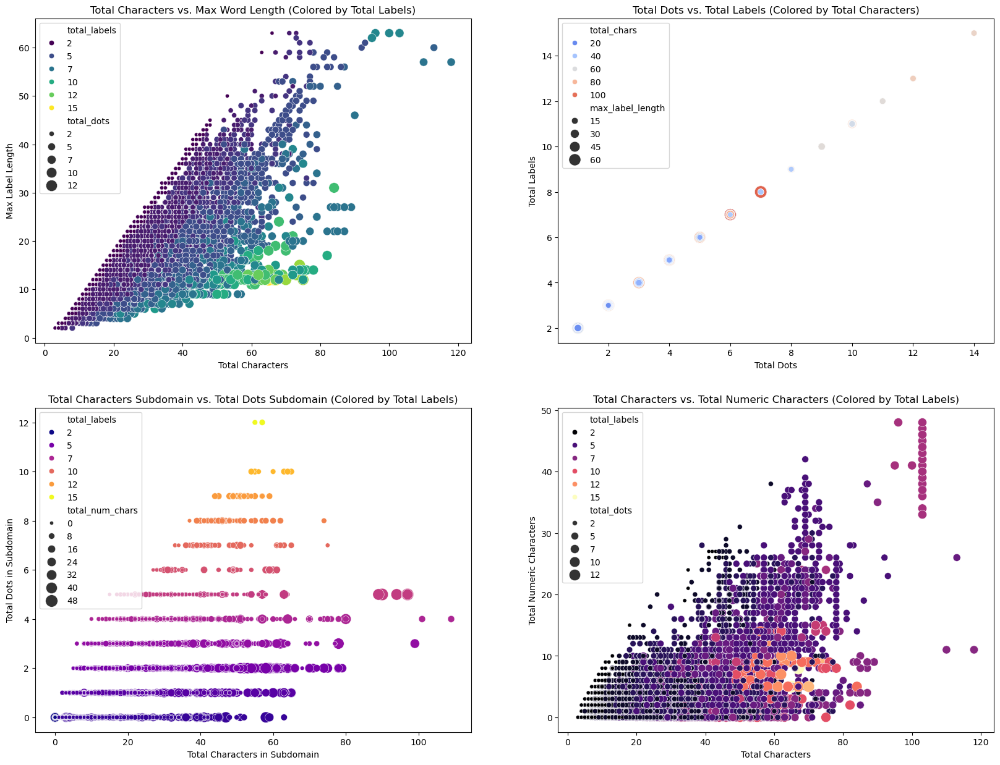

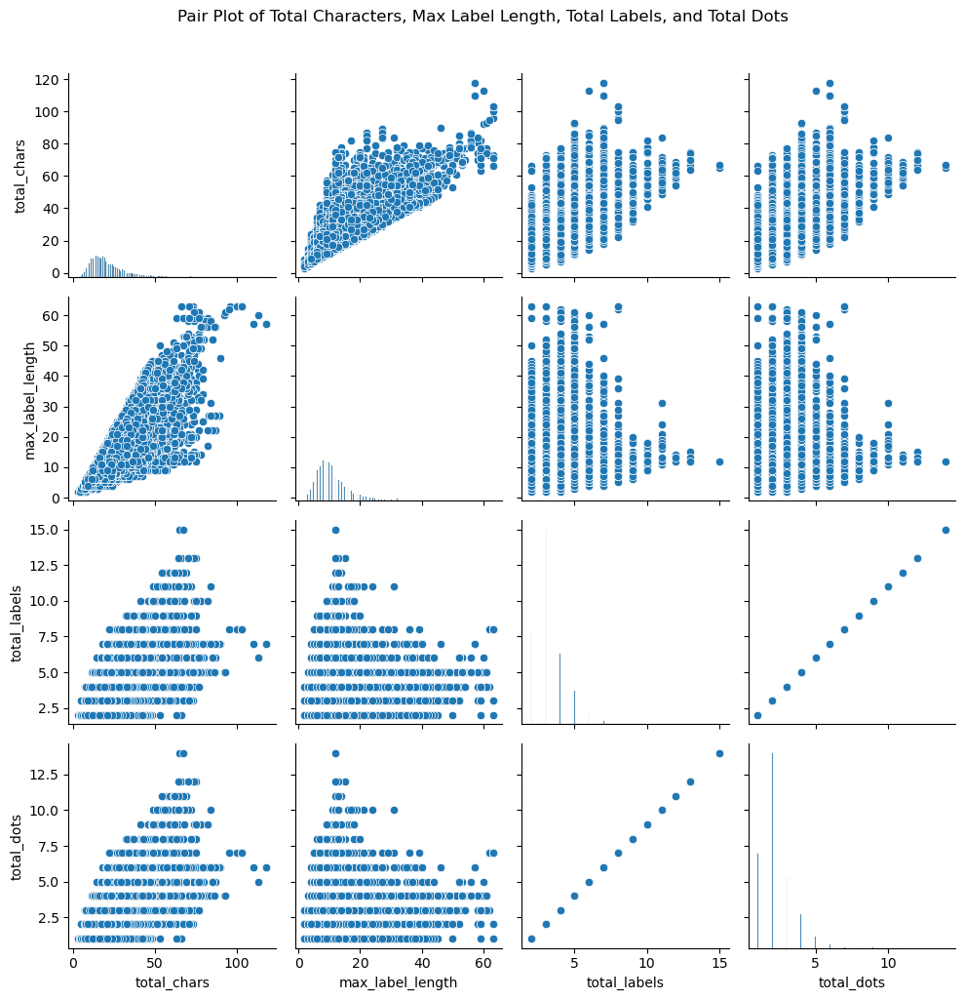

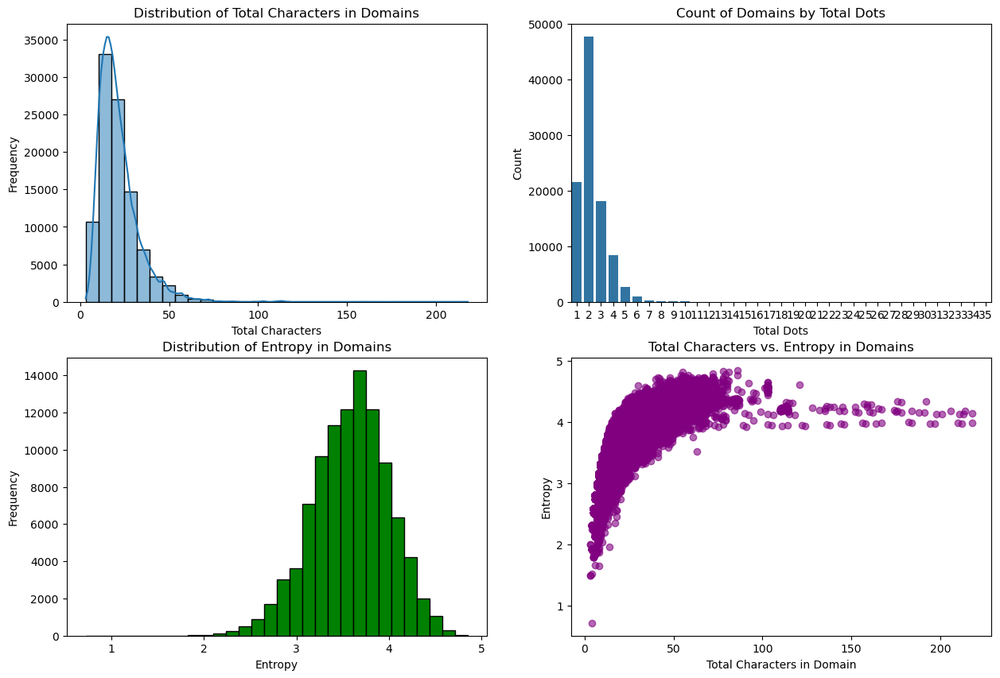

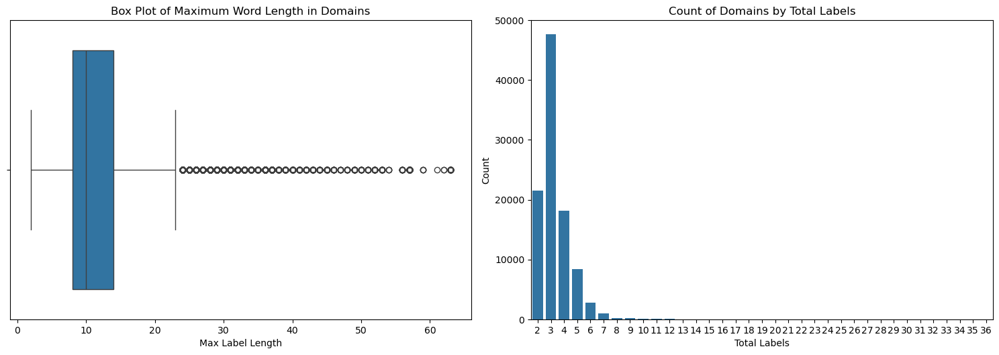

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

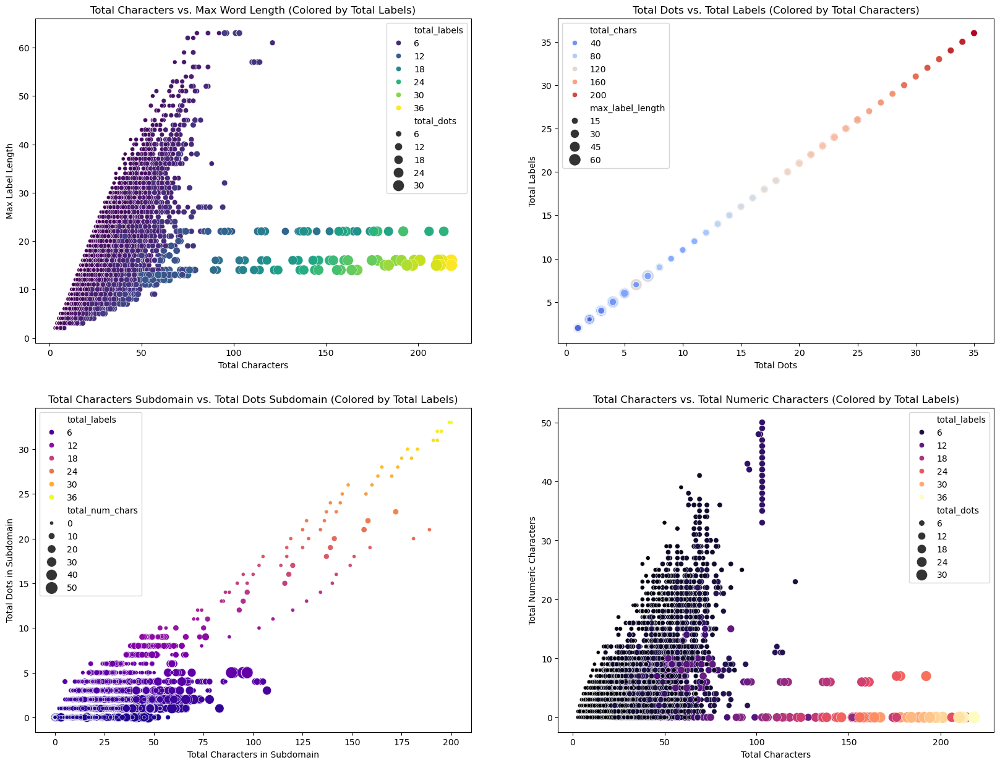

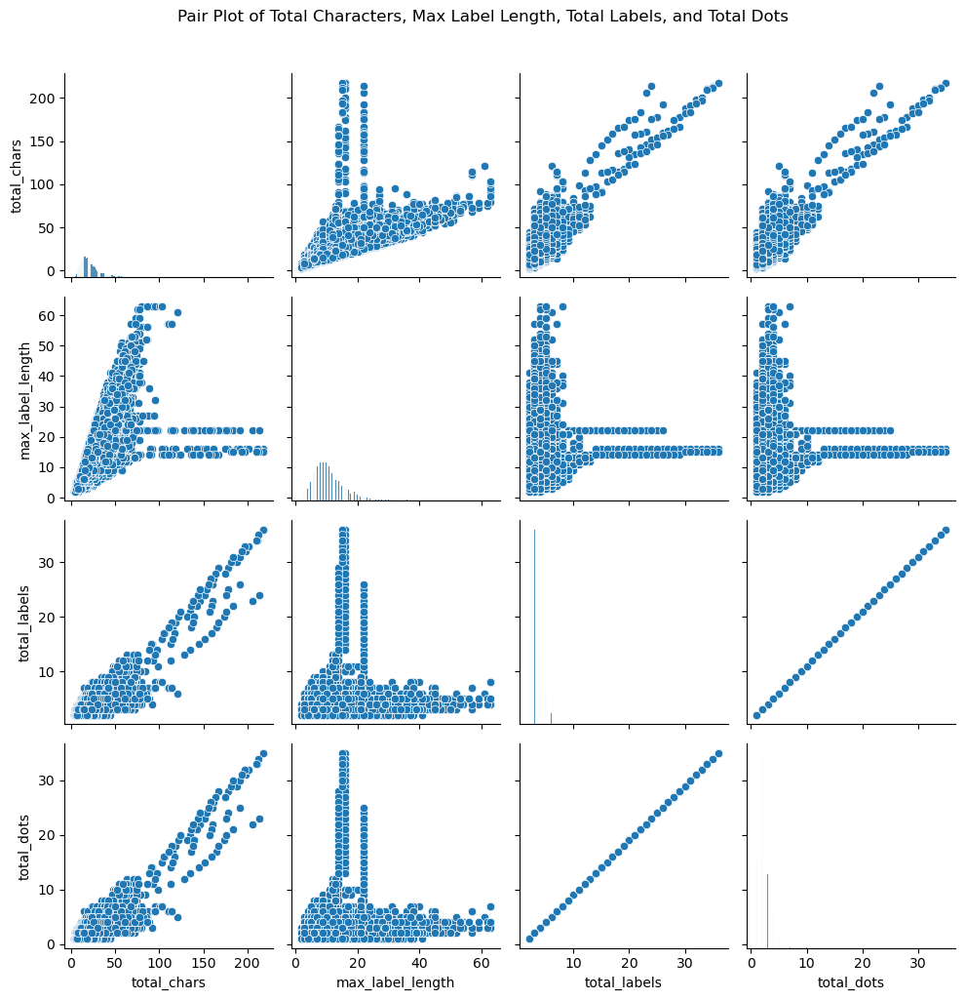

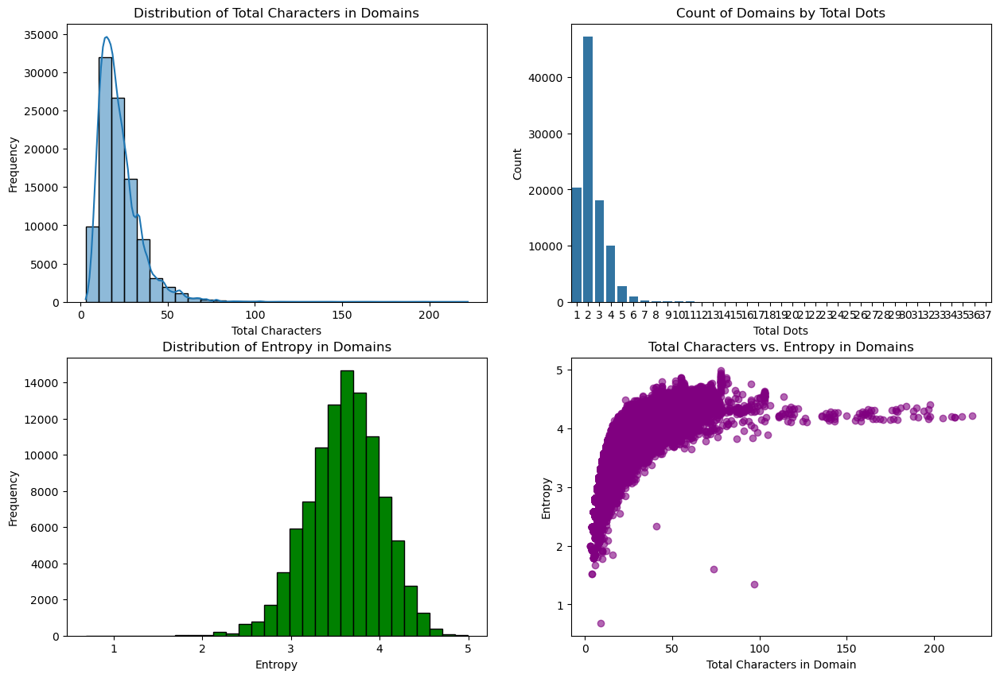

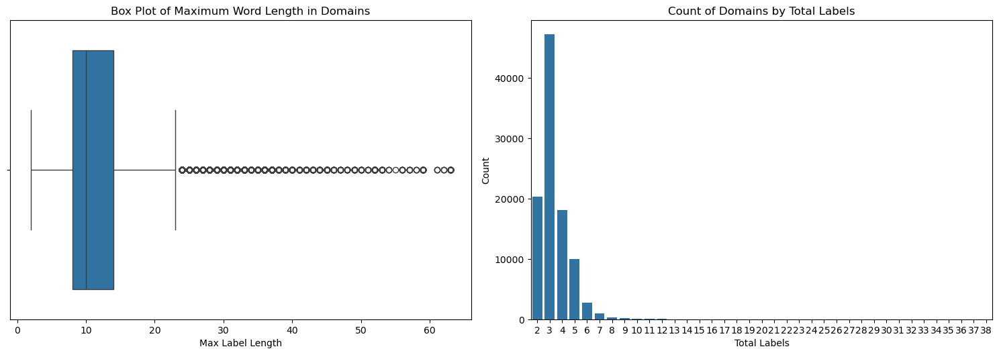

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

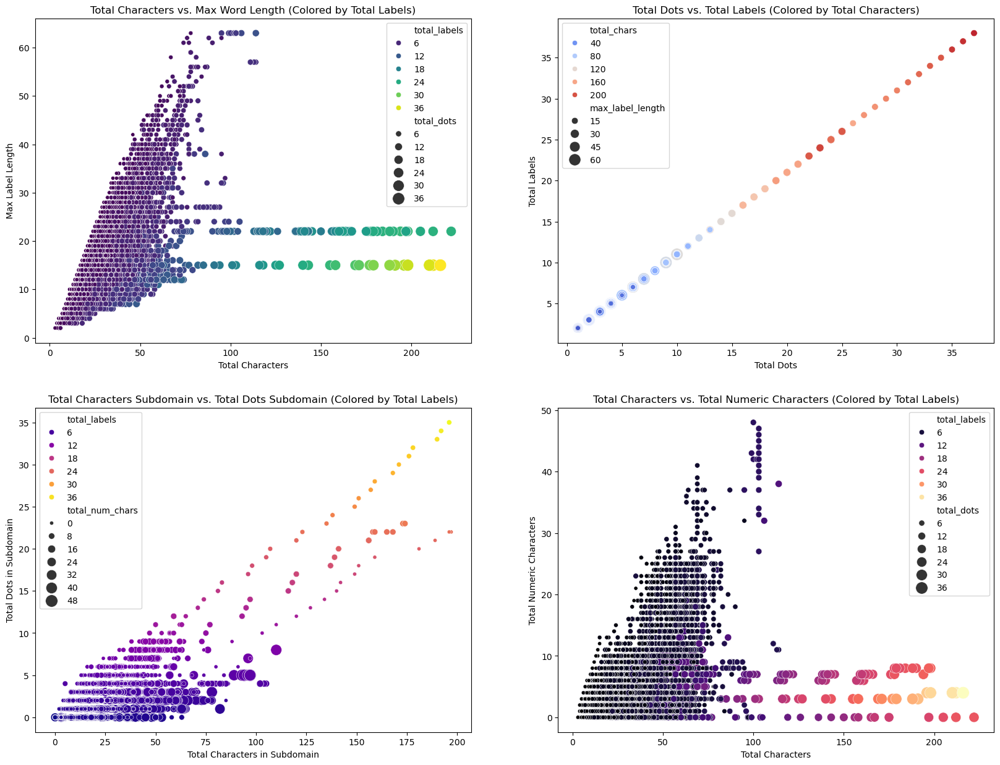

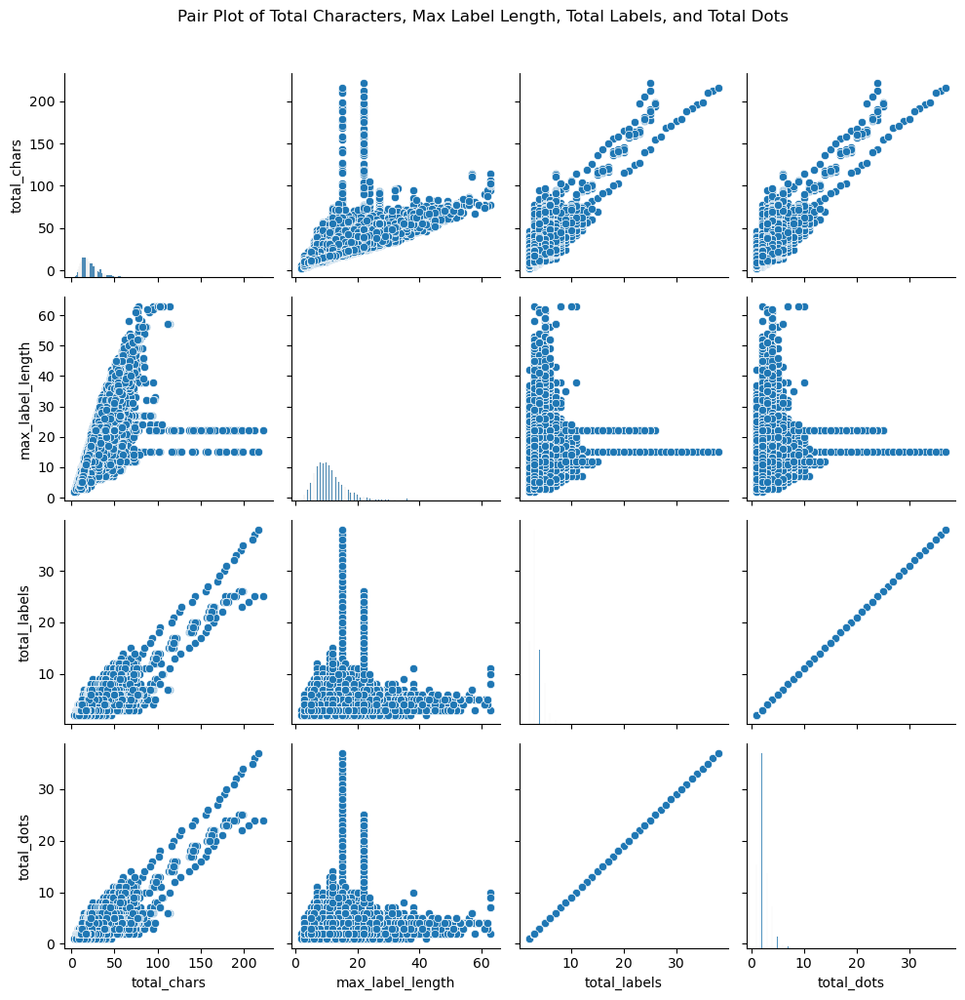

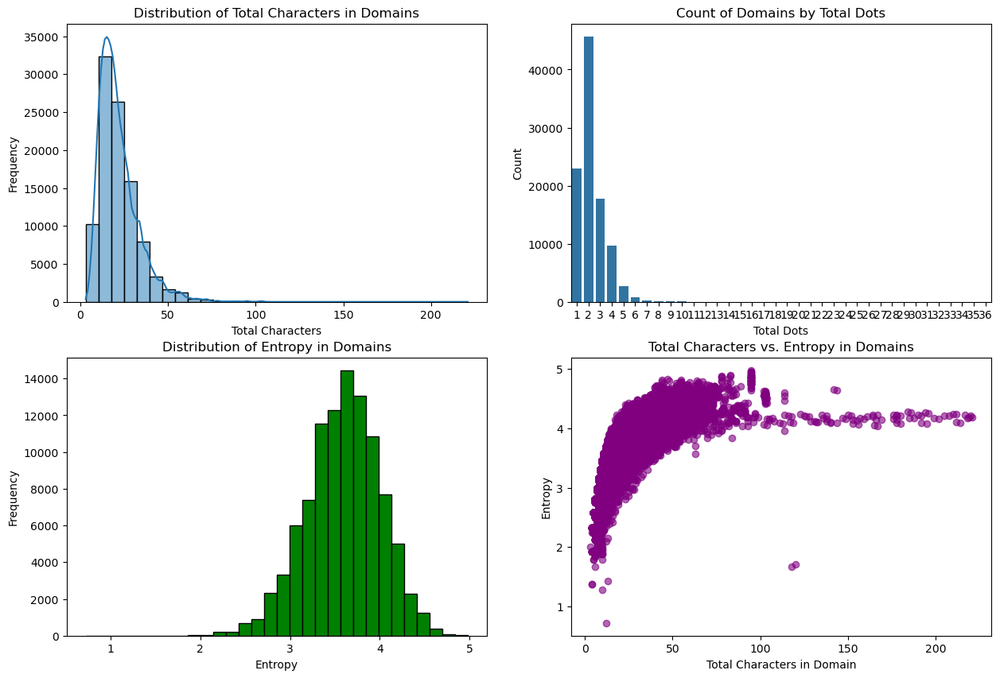

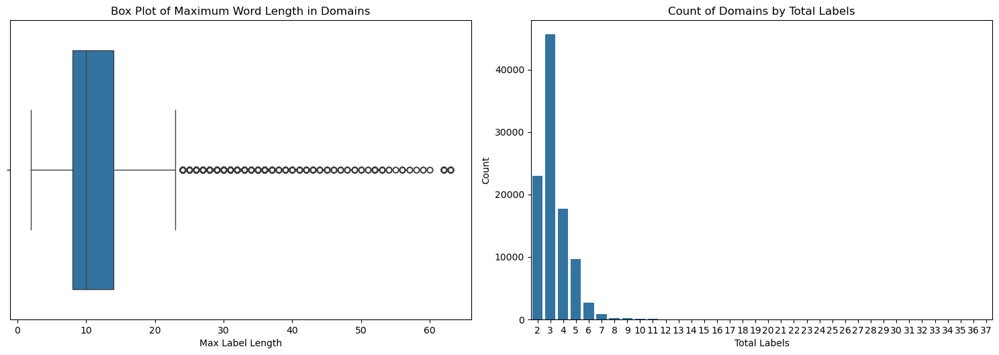

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

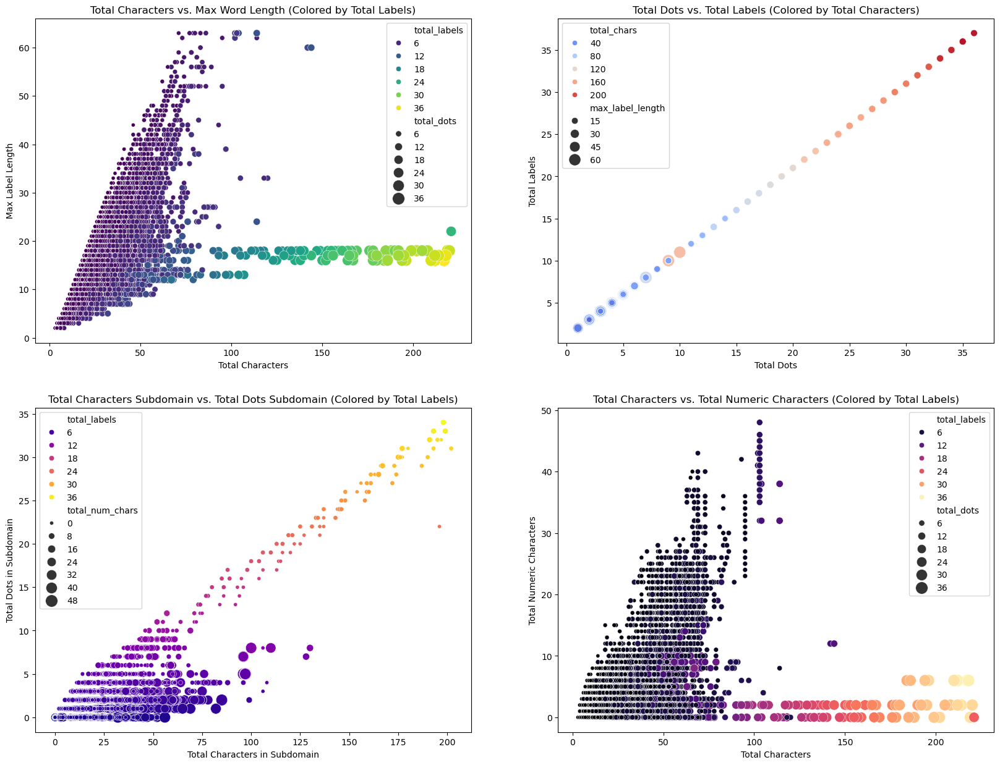

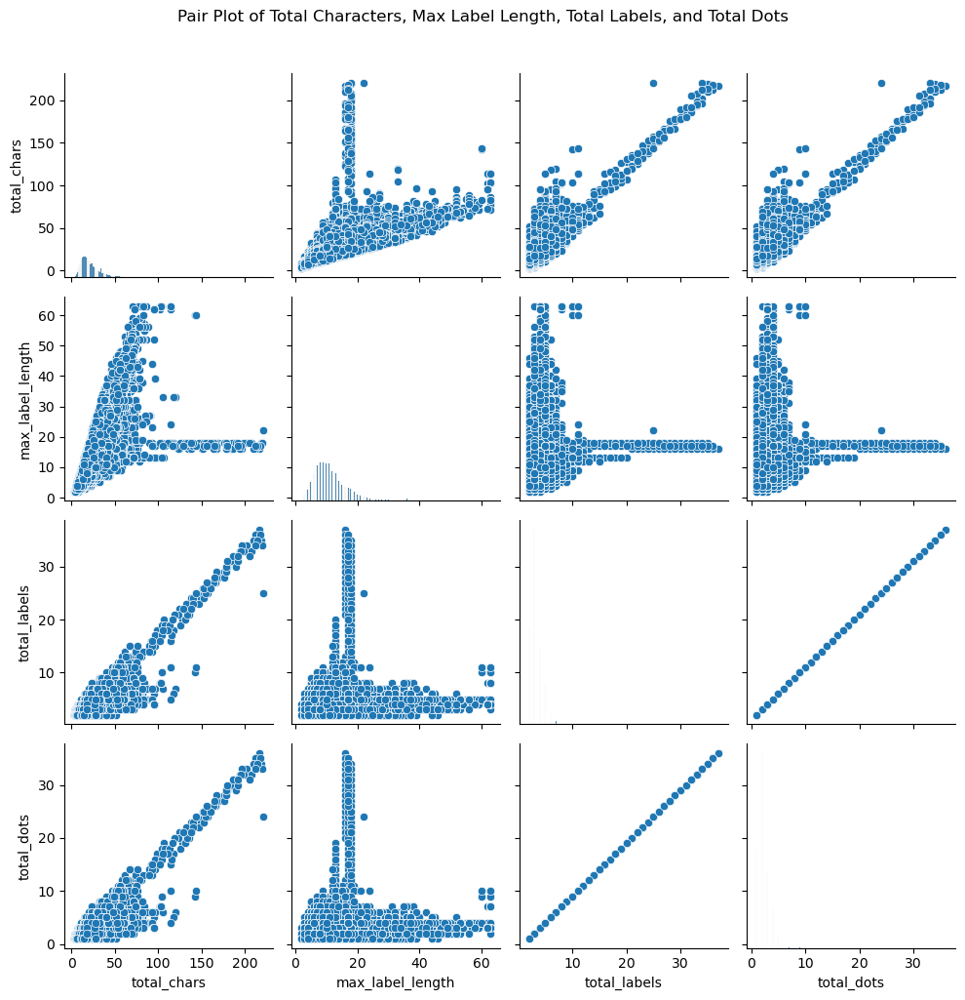

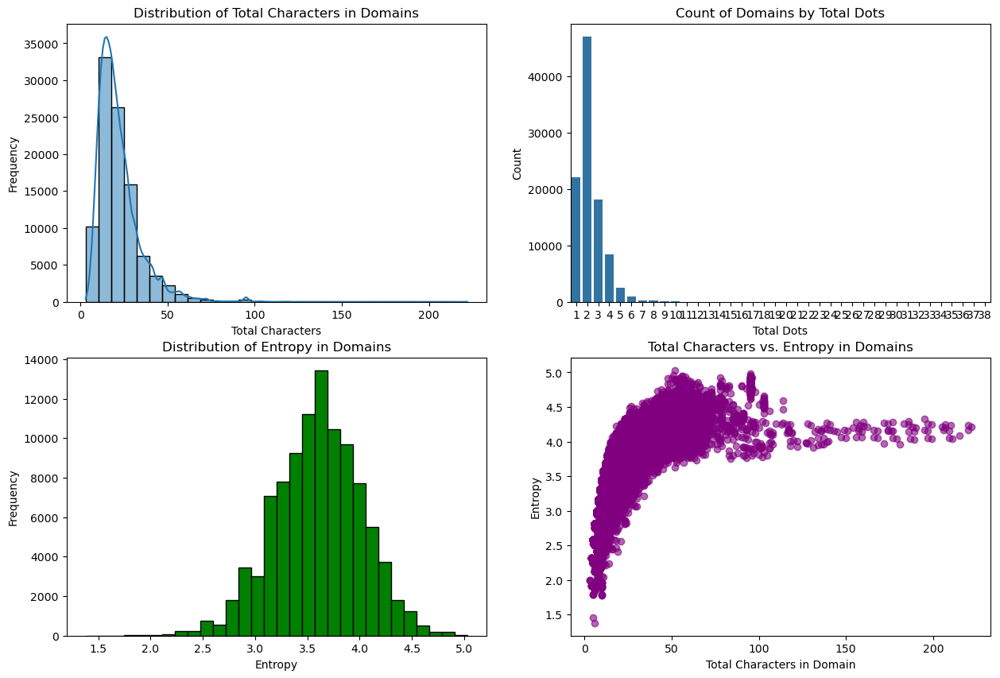

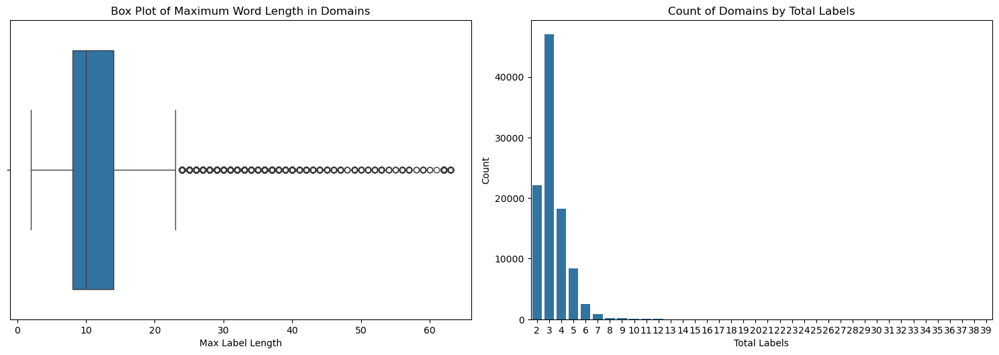

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

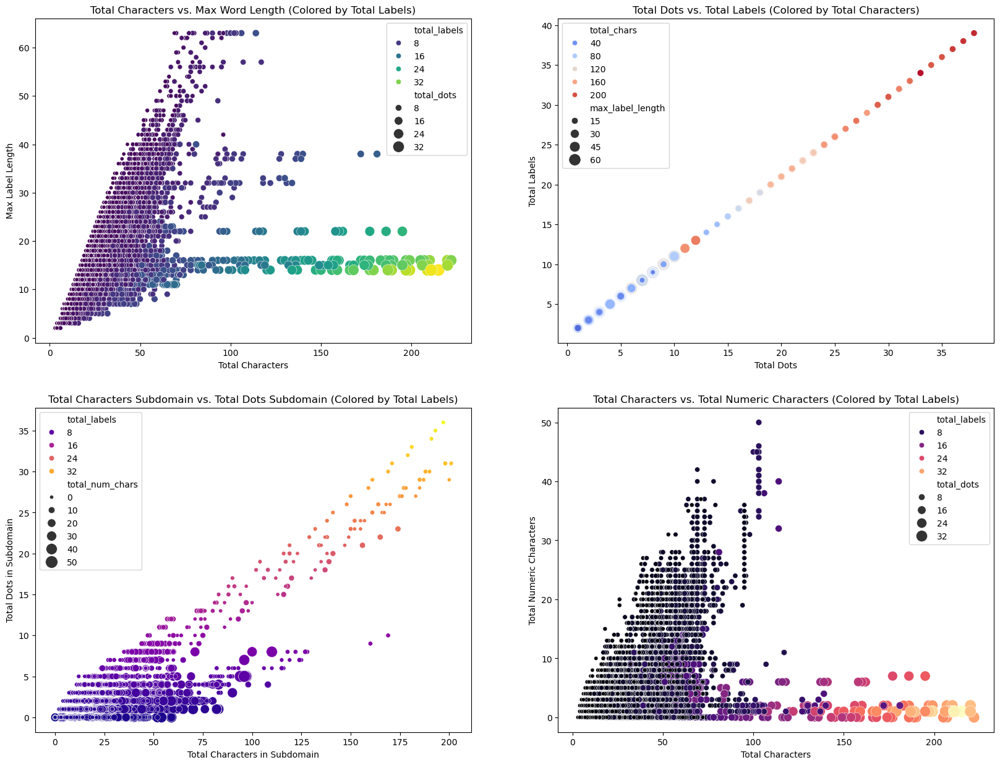

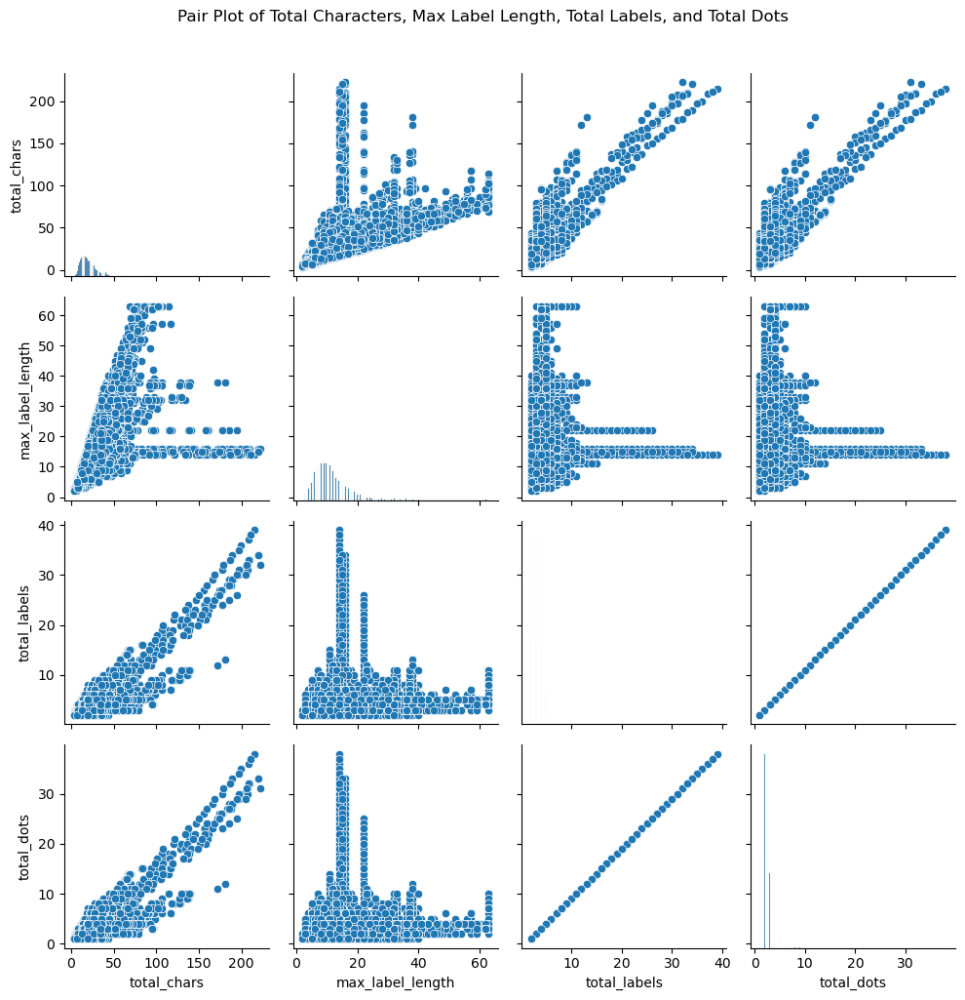

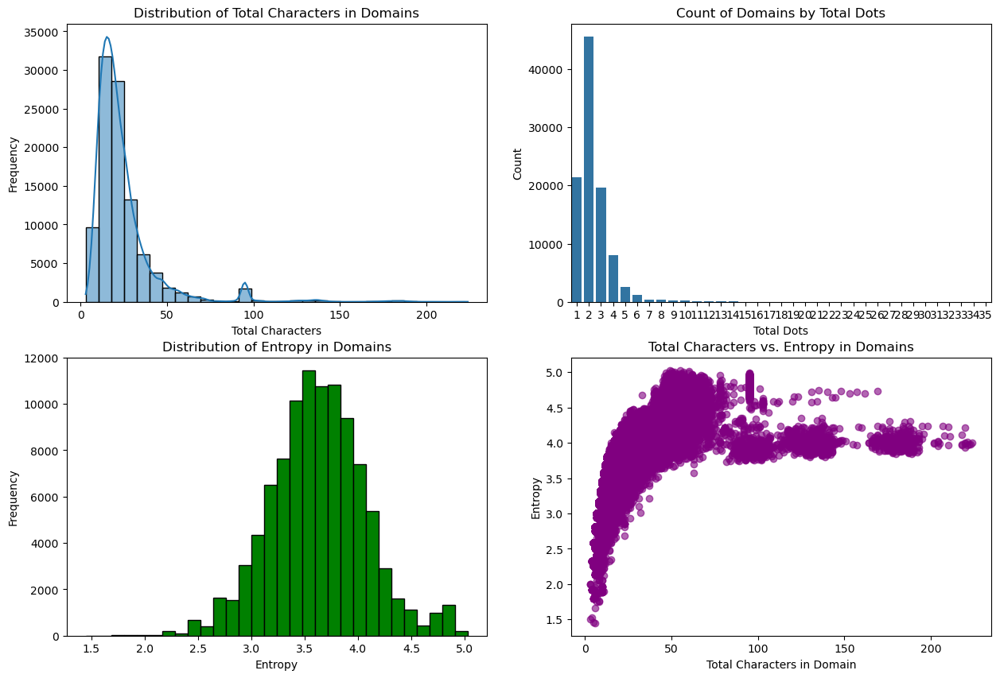

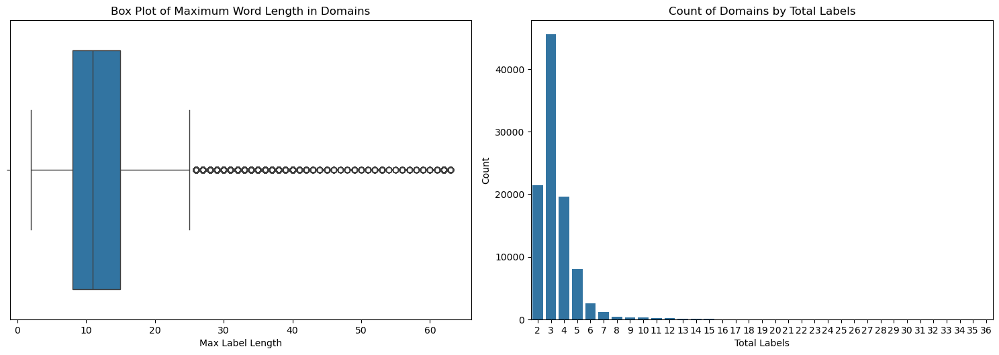

/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/NETID/vedpar/.conda/envs/libtensortf-onnx/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` 

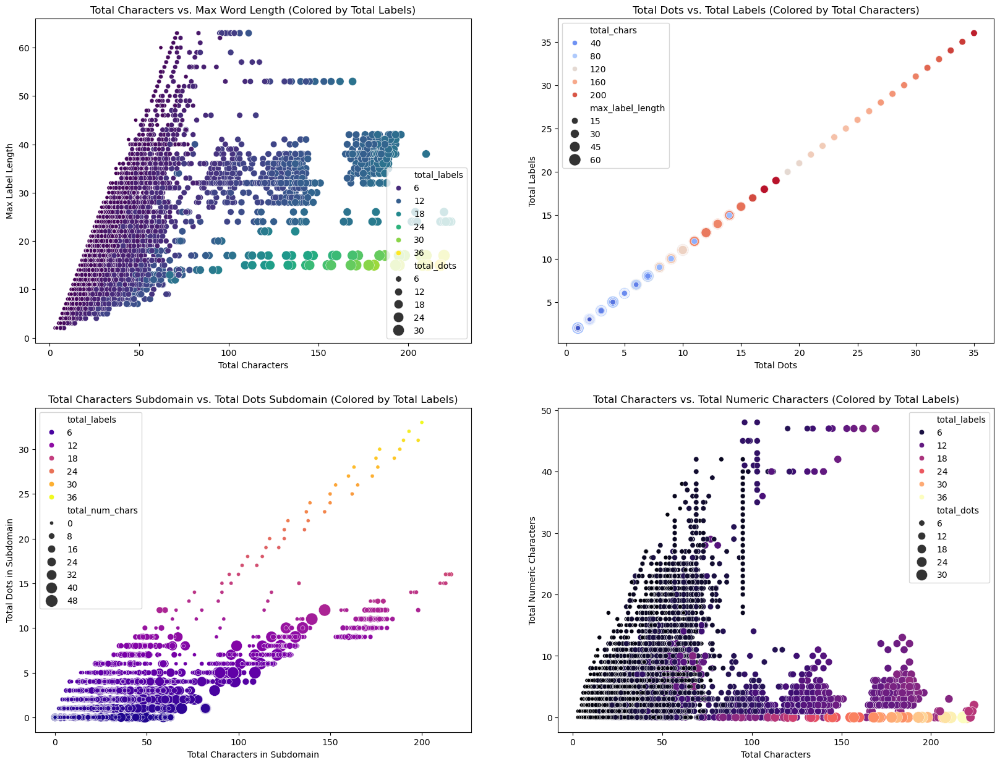

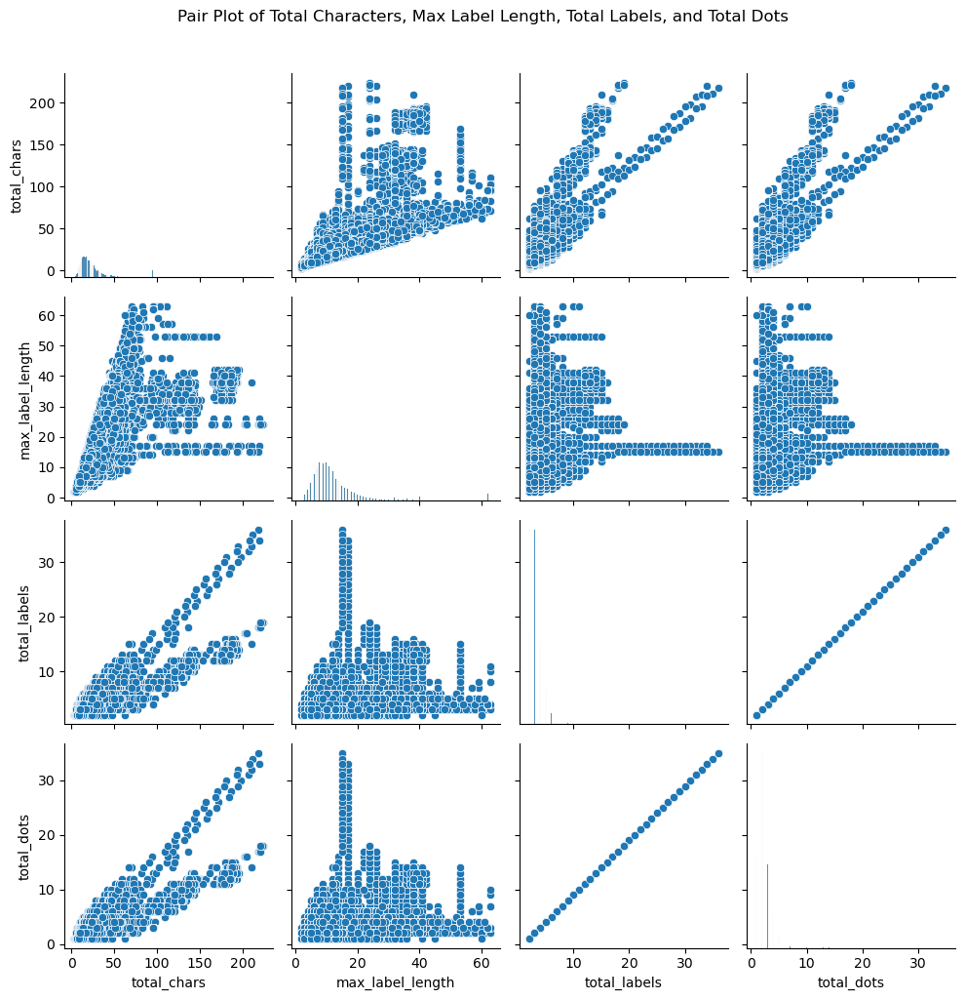

In [11]:
b = Ds(os.path.join(os.getcwd(),'datasets', 'top-1m.csv'))
b.read_pandas()

## Feature enginer and visualize the malicious data samples.


In [12]:
mal = Ds(os.path.join(os.getcwd(),'datasets', 'dataset_modified.csv'))
mal.read_malicious_ds()

feature engineer the malicious dataset from iodine and DET


### Feature Extraction using TF Data TextLineDataset for batches over 30 million samples dataset for Preprocessing and via tensorflow data batch processing.

In [7]:
class Features(object):

    def __init__(self) -> None:
        self.path = os.path.join(os.getcwd(),'datasets', 'dataset.csv')
        self.shuffleSize = 12_000 

    def readDetDataset(self, batchSize) -> None: 
        def parseData(record) -> Any:
            # process all the feature engineering and transform for the featyres 
            values = tf.strings.split(record, ',')
            total_chars = tf.strings.to_number(values[5], out_type=tf.float32)
            chars_in_subdomain = tf.strings.to_number(values[6], out_type=tf.float32)
            numerical_chars = tf.cast(tf.strings.length(tf.strings.regex_replace(values[4], r'\D', '')), dtype=tf.float32)
            uppercase_chars =  tf.cast(tf.strings.length(tf.strings.regex_replace(values[4], r'[^A-Z]', '')), dtype=tf.float32)
            domain_entropy = tf.strings.to_number(values[9], out_type=tf.float32)
            dots_in_domain = tf.cast(tf.strings.length(tf.strings.regex_replace(values[4], r'[^.]', '')), dtype=tf.float32)
            longest_label = tf.strings.to_number(values[8], out_type=tf.float32)
            average_label =  tf.cast(total_chars / (chars_in_subdomain + 1), dtype=tf.float32)

            # generate the input scalar vector for the DNN 
            features = [total_chars, chars_in_subdomain, numerical_chars, uppercase_chars,
                domain_entropy, dots_in_domain, longest_label, average_label]

            # standard scalar transform
            label = tf.cond(tf.equal(values[3], "True"), lambda: 1.0, lambda : 0.0)
            return tf.convert_to_tensor(features, dtype=tf.float32), label

            
        dataset = tf.data.TextLineDataset(self.path)
        dataset = dataset.map(parseData, num_parallel_calls=tf.data.experimental.AUTOTUNE)
        dataset = dataset.shuffle(buffer_size=10_000)
        dataset = dataset.batch(batch_size=batchSize)
        dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
        return dataset


### MirroredStrategy Distributed batch training over multiple GPU

In [9]:
strategy = tf.distribute.MirroredStrategy()

with strategy.scope():
    model = Sequential() 
    model.add(layers.InputLayer(shape=(8, )))
    model.add(layers.Dense(10,
                           activation='relu'))
    model.add(layers.Dense(8, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    model.summary()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 10)             │            90 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │            88 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 187 (748.00 B)

 Trainable params: 187 (748.00 B)

 Non-trainable params: 0 (0.00 B)

### Train the model and fit over test data

In [10]:
features = Features()
train_dataset = features.readDetDataset(batchSize=128_000)
train_data = train_dataset.take(80) # batch training for 80 % of the data 
test_data = train_dataset.skip(80)
model.fit(train_data, epochs=25, verbose=1)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Epoch 1/25


2024-10-29 07:30:47.072547: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: CANCELLED: GetNextFromShard was cancelled
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
2024-10-29 07:30:47.072623: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: CANCELLED: GetNextFromShard was cancelled
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]] [type.googleapis.com/tensorflow.DerivedStatus='']
2024-10-29 07:30:47.074344: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: CANCELLED: GetNextFromShard was cancelled
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]] [type.googleapis.com/tensorflow.DerivedStatus='']
2024-10-29 07:30:47.075675: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: CANCELLED: GetNextFromShard was cancelled
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 

INFO:tensorflow:Collective all_reduce tensors: 6 all_reduces, num_devices = 4, group_size = 4, implementation = CommunicationImplementation.NCCL, num_packs = 1
80/80 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.3622 - loss: 1.0667
Epoch 2/25


2024-10-29 07:33:35.170487: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]
2024-10-29 07:33:35.171669: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:33:35.171691: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:33:35.171710: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:33:35.171726: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:33:35.171732: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:33:35.171738: I 

80/80 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.9941 - loss: 0.2103
Epoch 3/25


2024-10-29 07:36:22.828749: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 530988896532271917
2024-10-29 07:36:22.828795: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{function_node cond_false_1381}}{{node cond/IteratorGetNext_1}}]]
	 [[cond/then/_0/cond/cond_3/output/_213/_89]]
2024-10-29 07:36:22.828821: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 07:36:22.828843: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 717686837186515762
2024-10-29 07:36:22.828849: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:36:22.828856: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489

80/80 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.9951 - loss: 0.0752
Epoch 4/25


2024-10-29 07:39:11.102392: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:39:11.102420: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:39:11.102446: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:39:11.102468: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:39:11.102486: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:39:11.102493: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11842832721152508568
2024-10-29 07:39:11.102500: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous rec

80/80 ━━━━━━━━━━━━━━━━━━━━ 169s 2s/step - accuracy: 0.9951 - loss: 0.0491
Epoch 5/25


2024-10-29 07:42:00.104753: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:42:00.104794: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:42:00.104821: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:42:00.104842: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:42:00.104861: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:42:00.104868: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:42:00.104874: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 169s 2s/step - accuracy: 0.9950 - loss: 0.0364
Epoch 6/25


2024-10-29 07:44:48.783332: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]
2024-10-29 07:44:48.784193: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:44:48.784212: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:44:48.784232: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:44:48.784248: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:44:48.784260: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:44:48.784266: I 

80/80 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.9931 - loss: 0.0252
Epoch 7/25


2024-10-29 07:47:39.291933: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:47:39.291969: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:47:39.291990: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:47:39.292009: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:47:39.292016: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:47:39.292037: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:47:39.292045: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.9915 - loss: 0.0189
Epoch 8/25


2024-10-29 07:50:29.396215: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:50:29.396256: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:50:29.396279: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:50:29.396297: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:50:29.396303: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:50:29.396321: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:50:29.396330: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.9916 - loss: 0.0158
Epoch 9/25


2024-10-29 07:53:19.568776: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:53:19.568821: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:53:19.568842: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:53:19.568848: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:53:19.568866: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:53:19.568886: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:53:19.568895: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.9944 - loss: 0.0139
Epoch 10/25


2024-10-29 07:56:10.560780: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:56:10.560820: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:56:10.560841: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:56:10.560847: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:56:10.560863: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 07:56:10.560879: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:56:10.560887: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9957 - loss: 0.0127
Epoch 11/25


2024-10-29 07:59:04.511909: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 07:59:04.511947: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 07:59:04.511972: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{function_node cond_false_1381}}{{node cond/IteratorGetNext_3}}]]
2024-10-29 07:59:04.511992: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 07:59:04.512011: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 07:59:04.512016: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 07:59:04.512024: 

80/80 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.9957 - loss: 0.0117
Epoch 12/25


2024-10-29 08:01:57.180231: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:01:57.180265: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:01:57.180272: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:01:57.180300: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:01:57.180317: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:01:57.180336: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 530988896532271917
2024-10-29 08:01:57.180340: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv 

80/80 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.9965 - loss: 0.0108
Epoch 13/25


2024-10-29 08:04:49.677677: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:04:49.677712: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:04:49.677732: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:04:49.677736: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:04:49.677757: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:04:49.677775: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 8041116881041917791
2024-10-29 08:04:49.677781: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9969 - loss: 0.0100
Epoch 14/25


2024-10-29 08:07:44.006727: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:07:44.006767: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:07:44.006790: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:07:44.006796: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:07:44.006819: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:07:44.006839: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:07:44.006848: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.9974 - loss: 0.0093
Epoch 15/25


2024-10-29 08:10:39.809193: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:10:39.809223: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:10:39.809232: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:10:39.809253: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:10:39.809273: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:10:39.809291: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 530988896532271917
2024-10-29 08:10:39.809296: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv i

80/80 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9976 - loss: 0.0086
Epoch 16/25


2024-10-29 08:13:35.229547: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:13:35.229580: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:13:35.229599: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:13:35.229617: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:13:35.229623: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:13:35.229638: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:13:35.229646: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv 

80/80 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9979 - loss: 0.0081
Epoch 17/25


2024-10-29 08:16:30.611602: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:16:30.611637: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:16:30.611660: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:16:30.611681: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:16:30.611701: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:16:30.611709: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11842832721152508568
2024-10-29 08:16:30.611712: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous rec

80/80 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9979 - loss: 0.0076
Epoch 18/25


2024-10-29 08:19:25.565861: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:19:25.565903: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:19:25.565923: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:19:25.565942: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:19:25.565962: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:19:25.565969: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14784544974430427492
2024-10-29 08:19:25.565976: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous rec

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9980 - loss: 0.0072
Epoch 19/25


2024-10-29 08:22:19.467544: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:22:19.467591: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:22:19.467624: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:22:19.467653: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:22:19.467661: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11842832721152508568
2024-10-29 08:22:19.467665: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14784544974430427492
2024-10-29 08:22:19.467680: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous rec

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9980 - loss: 0.0068
Epoch 20/25


2024-10-29 08:25:13.887182: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:25:13.887223: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:25:13.887246: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:25:13.887264: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:25:13.887270: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:25:13.887291: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:25:13.887300: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9981 - loss: 0.0065
Epoch 21/25


2024-10-29 08:28:07.397276: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:28:07.397311: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:28:07.397333: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:28:07.397349: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:28:07.397354: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:28:07.397363: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:28:07.397382: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv 

80/80 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9982 - loss: 0.0062
Epoch 22/25


2024-10-29 08:31:01.147375: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:31:01.147422: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{function_node cond_false_1381}}{{node cond/IteratorGetNext}}]]
	 [[cond/output/_16/_100]]
2024-10-29 08:31:01.147430: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:31:01.147455: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:31:01.147466: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:31:01.147505: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 8041116881041917791
20

80/80 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.9982 - loss: 0.0059
Epoch 23/25


2024-10-29 08:33:53.787641: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:33:53.787674: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:33:53.787698: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:33:53.787714: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:33:53.787718: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:33:53.787735: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:33:53.787742: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv 

80/80 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9982 - loss: 0.0056
Epoch 24/25


2024-10-29 08:36:49.012589: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:36:49.012624: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:36:49.012645: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:36:49.012663: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:36:49.012673: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:36:49.012679: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11842832721152508568
2024-10-29 08:36:49.012682: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.9982 - loss: 0.0054
Epoch 25/25


2024-10-29 08:39:42.510517: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:39:42.510550: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14489845943153107711
2024-10-29 08:39:42.510567: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:39:42.510585: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:39:42.510592: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:39:42.510599: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 8041116881041917791
2024-10-29 08:39:42.510605: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv

80/80 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.9983 - loss: 0.0052


2024-10-29 08:42:38.444201: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16642778898603045110
2024-10-29 08:42:38.444237: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 12252867414494298367
2024-10-29 08:42:38.444256: I tensorflow/core/framework/local_rendezvous.cc:427] Local rendezvous send item cancelled. Key hash: 3577454501671309507
2024-10-29 08:42:38.444263: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 7133143455374122661
2024-10-29 08:42:38.444278: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16735918226877776353
2024-10-29 08:42:38.444299: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 1779923279024596345
2024-10-29 08:42:38.444305: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv 

## Convert the Model to ONNX and H5 

In [12]:
onnx_model_path = "dns_sec.onnx"
model.output_names=['output']
input_signature = (tf.TensorSpec([None, 8], tf.float32),)
model.save('dns_sec.h5')
#onnx_model, _ = tf2onnx.convert.from_keras(model=model, input_signature=input_signature, output_path=onnx_model_path)

In [14]:
onnx_model, _ = tf2onnx.convert.from_keras(model, input_signature=input_signature)
with open(onnx_model_path, "wb") as f:
    f.write(onnx_model.SerializeToString())

I0000 00:00:1730217036.379000 3848384 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 4
2024-10-29 08:50:36.379069: I tensorflow/core/grappler/clusters/single_machine.cc:361] Starting new session
2024-10-29 08:50:36.381668: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22502 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:17:00.0, compute capability: 8.6
2024-10-29 08:50:36.381827: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22502 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:31:00.0, compute capability: 8.6
2024-10-29 08:50:36.381980: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 22502 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:b1:00.0, compute capability: 8.6

In [15]:
import onnxruntime as ort

ModuleNotFoundError: No module named 'onnxruntime'

In [41]:
y_true = []
y_pred = []

for features, labels in test_data:
    y_true.extend(labels.numpy())
    predictions = model.predict(features)
    y_pred.extend(predictions)
    

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 960us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 960us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 983us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 955us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 954us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 941us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 929us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 949us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 941us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 974us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 947us/step


2024-10-20 16:36:41.163187: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 939us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 937us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 941us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 979us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 947us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 954us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 942us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 937us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 939us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 952us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 956us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 959us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 982us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━

2024-10-20 16:39:19.356990: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 959us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step 
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/400

2024-10-20 16:44:44.315501: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 980us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 955us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 955us/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
4000/

2024-10-20 16:50:28.067672: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 3 of dimension 0 out of bounds.
2024-10-20 16:50:28.067711: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 9 of dimension 0 out of bounds.
2024-10-20 16:50:28.067731: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 4 of dimension 0 out of bounds.
2024-10-20 16:50:28.067738: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 8 of dimension 0 out of bounds.
2024-10-20 16:50:28.067741: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 5 of dimension 0 out of bounds.
2024-10-20 16:50:28.067745: W tensorflow/core/framework/op_kernel.cc:1840] 

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
   1/4000 ━━━━━━━━━━━━━━━━━━━━ 9:28 142ms/step

2024-10-20 16:50:31.792837: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 3 of dimension 0 out of bounds.
2024-10-20 16:50:31.792860: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 9 of dimension 0 out of bounds.
2024-10-20 16:50:31.792864: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 4 of dimension 0 out of bounds.
2024-10-20 16:50:31.792867: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 8 of dimension 0 out of bounds.
2024-10-20 16:50:31.792871: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 5 of dimension 0 out of bounds.
2024-10-20 16:50:31.792874: W tensorflow/core/framework/op_kernel.cc:1840] 

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


2024-10-20 16:50:37.035495: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 9 of dimension 0 out of bounds.
2024-10-20 16:50:37.035518: W tensorflow/core/framework/op_kernel.cc:1840] OP_REQUIRES failed at strided_slice_op.cc:111 : INVALID_ARGUMENT: slice index 8 of dimension 0 out of bounds.


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


InvalidArgumentError: {{function_node __wrapped__IteratorGetNext_output_types_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} Error in user-defined function passed to ParallelMapDatasetV2:128 transformation with iterator: Iterator::Root::Prefetch::FiniteSkip::Prefetch::BatchV2::Shuffle::ParallelMapV2: StringToNumberOp could not correctly convert string: Fal55555
	 [[{{node StringToNumber}}]] [Op:IteratorGetNext] name: 